<a href="https://colab.research.google.com/github/Shegy12/GAN-for-generating-artificial-ECG-data/blob/master/EKG_GAN_SGD4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project description**

Generative Adversial Network for Artificial ECG Generation


# **Install python packages**

In [0]:
!python --version
import keras
!pip3 install scipy keras
print(keras.__version__)


Python 3.6.9


Using TensorFlow backend.


2.3.1


# **Imports**

In [0]:
# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Built-in modules
import sys
import os
import datetime
from enum import Enum
from pathlib import Path
from timeit import default_timer as timer

# numpy
import numpy as np
from numpy import zeros
from numpy import ones
from numpy import hstack
from numpy.random import rand
from numpy.random import randn

# Basics of Python data handling and visualization

import matplotlib.pyplot as plt
from matplotlib import pyplot
import scipy.io as sio
from timeit import default_timer as timer
import matplotlib as mpl

#keras
from keras.models import Sequential
from keras.layers import Conv1D, TimeDistributed, MaxPooling1D, Dense, Softmax, Flatten, LeakyReLU, Activation, BatchNormalization, Dropout, LSTM, Bidirectional, Reshape
from keras.activations import relu
from keras.utils.vis_utils import plot_model
from keras.optimizers import Adam
from keras.optimizers import SGD
from keras.initializers import RandomNormal

#preprocessing
import random
from sklearn import preprocessing
import scipy.stats
from scipy.signal import resample

# **Google drive**

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

GOOGLE_DRIVE_PATH = Path('/content/gdrive/My Drive')
WORKDIR = 'ECG_DATA' # nazov pracovneho priecinku
WORKDIR_PATH = GOOGLE_DRIVE_PATH / WORKDIR

if not os.path.exists(WORKDIR_PATH):
          os.mkdir(WORKDIR_PATH)

          

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


# **Paths**

In [0]:
#ANNOTATION - nazvy a anotacie/labely
ANNOTATION_PATH = WORKDIR_PATH / "annotFull.mat"
#MATDATA - signal database (.mat)
SINUS_PATH = WORKDIR_PATH / "SINUS"
AF_SV_VR_PATH = WORKDIR_PATH / "AF_SV_VR"
AB_AV_BB_PV_PATH = WORKDIR_PATH / "AB_AV_BB_PV"
OTHER_NOISY_PATH = WORKDIR_PATH / "OTHER_NOISY"

#**Data manipulation** (signals and labels)

In [0]:
matlab_data = sio.loadmat(file_name=ANNOTATION_PATH)
Ydata = matlab_data['YData']
print('Shape of Ydata ->' + str(Ydata.shape)+', 6884 = number of signals, 2 = signal_names,signal_labels')

signal_names = Ydata[:,0] 
signal_names = [str(signal_names).replace('[', '').replace("'", '').replace(']', '') for signal_names in signal_names.tolist()[:]]
#print('Number of signals ->' + str(len(signal_names)))
print('Names of signals ->' + str(signal_names))

signal_labels = Ydata[:,1]
#signal_labels = [str(signal_labels).replace('[', '').replace(']', '').replace(' ','') for signal_labels in signal_labels.tolist()[:]]
#print('Number of labels ->' + str(len(signal_labels)))
print('Signal labels ->' + str(signal_labels))

labels_names = matlab_data['annotLabel']
labels_names = [str(labels_names).replace('[', '').replace("'", '').replace(']', '').replace('', '') for labels_names in labels_names.tolist()[0]]
print('Names of labels ->' + str(labels_names))

# replace("'",'')


Shape of Ydata ->(6884, 2), 6884 = number of signals, 2 = signal_names,signal_labels
Names of signals ->['EB0000018570.mat', 'EB0000018571.mat', 'EB0000018572.mat', 'EB0000018573.mat', 'EB0000018574.mat', 'EB0000018575.mat', 'EB0000018576.mat', 'EB0000018577.mat', 'EB0000018578.mat', 'EB0000018579.mat', 'EB0000018580.mat', 'EB0000018581.mat', 'EB0000018582.mat', 'EB0000018583.mat', 'EB0000018584.mat', 'EB0000018585.mat', 'EB0000018586.mat', 'EB0000018587.mat', 'EB0000018588.mat', 'EB0000018589.mat', 'EB0000018590.mat', 'EB0000018591.mat', 'EB0000018592.mat', 'EB0000018593.mat', 'EB0000018594.mat', 'EB0000018595.mat', 'EB0000018596.mat', 'EB0000018597.mat', 'EB0000018598.mat', 'EB0000018599.mat', 'EB0000018600.mat', 'EB0000018601.mat', 'EB0000018602.mat', 'EB0000018603.mat', 'EB0000018604.mat', 'EB0000018605.mat', 'EB0000018606.mat', 'EB0000018607.mat', 'EB0000018608.mat', 'EB0000018609.mat', 'EB0000018610.mat', 'EB0000018611.mat', 'EB0000018612.mat', 'EB0000018613.mat', 'EB0000018614.m

# **Creating the database**

**Signaly1** = Signals with MULTIPLE labels (including specific type of label)

**Signaly2** = Signals with ONLY one type of label

In [0]:
AF1=[]; SI1=[];SV1=[];VR1=[];OT1=[];AV1=[];BB1=[];AB1=[];PV1=[];NO1=[]
AF2=[]; SI2=[];SV2=[];VR2=[];OT2=[];AV2=[];BB2=[];AB2=[];PV2=[];NO2=[]

def signal_type(i):
  switcher={
      0:AF2,1:SI2,2:SV2,3:VR2,4:OT2,5:AV2,6:BB2,7:AB2,8:PV2,9:NO2,
      10:AF1,11:SI1,12:SV1,13:VR1,14:OT1,15:AV1,16:BB1,17:AB1,18:PV1,19:NO1
    }
  return switcher.get(i,"Invalid number of label")


prefix=['AF2','SI2','SV2','VR2','OT2','AV2','BB2','AB2','PV2','NO1','AF1','SI1','SV1','VR1','OT1','AV1','BB1','AB1','PV1','NO1']

for counter in range(10,20):
  for item in Ydata.tolist():
    if list(item[1][0])[counter-10] == 1:
      signal_type(counter).append(str(prefix[counter])+str(item[0]).replace('[', '').replace("'", '').replace(']', ''))


print('Signals with MANY types of labels including specific type of label:')
print('')
print('Number of AF1 signals ->' + str(len(signal_type(10))))
print('Number of SI1 signals ->' + str(len(signal_type(11))))
print('Number of SV1 signals ->' + str(len(signal_type(12))))
print('Number of VR1 signals ->' + str(len(signal_type(13))))
print('Number of OT1 signals ->' + str(len(signal_type(14))))
print('Number of AV1 signals ->' + str(len(signal_type(15))))
print('Number of BB1 signals ->' + str(len(signal_type(16))))
print('Number of AB1 signals ->' + str(len(signal_type(17))))
print('Number of PV1 signals ->' + str(len(signal_type(18))))
print('Number of NO1 signals ->' + str(len(signal_type(19))))
print('')

counter=0
for counter in range(10):
  for item in Ydata.tolist():
    if list(item[1][0])[counter] == 1 and sum(list(item[1][0])) < 2:
      signal_type(counter).append(str(prefix[counter])+str(item[0]).replace('[', '').replace("'", '').replace(']', ''))

print('Signals with ONLY one type of label:')
print('')
print('Number of AF2 signals ->' + str(len(signal_type(0))))
print('Number of SI2 signals ->' + str(len(signal_type(1))))
print('Number of SV2 signals ->' + str(len(signal_type(2))))
print('Number of VR2 signals ->' + str(len(signal_type(3))))
print('Number of OT2 signals ->' + str(len(signal_type(4))))
print('Number of AV2 signals ->' + str(len(signal_type(5))))
print('Number of BB2 signals ->' + str(len(signal_type(6))))
print('Number of AB2 signals ->' + str(len(signal_type(7))))
print('Number of PV2 signals ->' + str(len(signal_type(8))))
print('Number of NO2 signals ->' + str(len(signal_type(9))))
print('')

print('Database of signals was created.')

Signals with MANY types of labels including specific type of label:

Number of AF1 signals ->553
Number of SI1 signals ->5942
Number of SV1 signals ->194
Number of VR1 signals ->102
Number of OT1 signals ->88
Number of AV1 signals ->250
Number of BB1 signals ->434
Number of AB1 signals ->418
Number of PV1 signals ->413
Number of NO1 signals ->2183

Signals with ONLY one type of label:

Number of AF2 signals ->267
Number of SI2 signals ->3350
Number of SV2 signals ->89
Number of VR2 signals ->69
Number of OT2 signals ->5
Number of AV2 signals ->0
Number of BB2 signals ->0
Number of AB2 signals ->0
Number of PV2 signals ->0
Number of NO2 signals ->69

Database of signals was created.


##Lead II

Text(0, 0.5, 'Amplitúda [μV]')

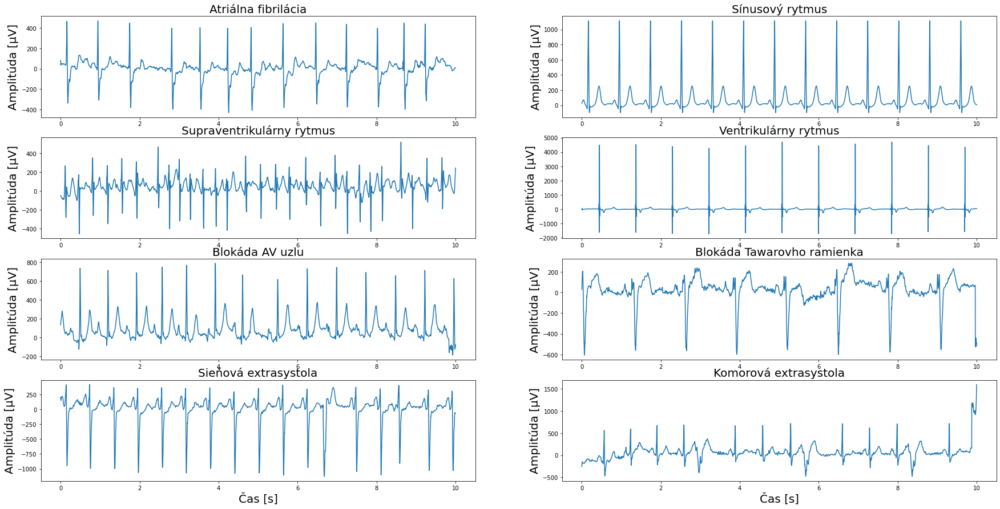

In [0]:
#AF1_PATH=AF_SV_VR_PATH / AF1[0]
#SV1_PATH=AF_SV_VR_PATH / SV1[0]
#VR1_PATH=AF_SV_VR_PATH / VR1[0]

AF2_PATH=AF_SV_VR_PATH / AF2[0]
SI2_PATH=SINUS_PATH / SI2[0]
SV2_PATH=AF_SV_VR_PATH / SV2[0]
VR2_PATH=AF_SV_VR_PATH / VR2[0]
AV1_PATH=AB_AV_BB_PV_PATH / AV1[0]
BB1_PATH=AB_AV_BB_PV_PATH / BB1[0]
AB1_PATH=AB_AV_BB_PV_PATH / AB1[0]
PV1_PATH=AB_AV_BB_PV_PATH / PV1[0]

#AF1_signal=sio.loadmat(AF1_PATH);
#SV1_signal=sio.loadmat(SV1_PATH)
#VR1_signal=sio.loadmat(VR1_PATH);

AF2_signal=sio.loadmat(AF2_PATH)
SI2_signal=sio.loadmat(SI2_PATH)
SV2_signal=sio.loadmat(SV2_PATH)
VR2_signal=sio.loadmat(VR2_PATH)
AV1_signal=sio.loadmat(AV1_PATH);
BB1_signal=sio.loadmat(BB1_PATH)
AB1_signal=sio.loadmat(AB1_PATH);
PV1_signal=sio.loadmat(PV1_PATH)

time_axis=np.linspace(0,10,5000)
plt.figure(figsize=(30,15))
plt.subplot(4, 2, 1)
AF2_signal=AF2_signal['data']
plt.plot(time_axis, (AF2_signal[:,0]))
pyplot.title('Atriálna fibrilácia',fontsize=20)
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 2)
SI2_signal=SI2_signal['data']
plt.plot(time_axis, (SI2_signal[:,0]))
pyplot.title('Sínusový rytmus',fontsize=20)
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 3)
SV2_signal=SV2_signal['data']
plt.plot(time_axis, (SV2_signal[:,0]))
pyplot.title('Supraventrikulárny rytmus',fontsize=20)
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 4)
VR2_signal=VR2_signal['data']
plt.plot(time_axis, (VR2_signal[:,0]))
pyplot.title('Ventrikulárny rytmus',fontsize=20)
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 5)
AV1_signal=AV1_signal['data']
plt.plot(time_axis, (AV1_signal[:,0]))
pyplot.title('Blokáda AV uzlu',fontsize=20)
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 6)
BB1_signal=BB1_signal['data']
plt.plot(time_axis, (BB1_signal[:,0]))
pyplot.title('Blokáda Tawarovho ramienka',fontsize=20)
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 7)
AB1_signal=AB1_signal['data']
plt.plot(time_axis, (AB1_signal[:,0]))
pyplot.title('Sieňová extrasystola',fontsize=20)
pyplot.xlabel('Čas [s]',fontsize=20)
pyplot.ylabel('Amplitúda [μV]',fontsize=20)
plt.subplot(4, 2, 8)
PV1_signal=PV1_signal['data']
plt.plot(time_axis, (PV1_signal[:,0]))
pyplot.title('Komorová extrasystola',fontsize=20)
pyplot.xlabel('Čas [s]',fontsize=20)
pyplot.ylabel('Amplitúda [μV]',fontsize=20)


##AvR

Text(0, 0.5, 'Amplitude [μV]')

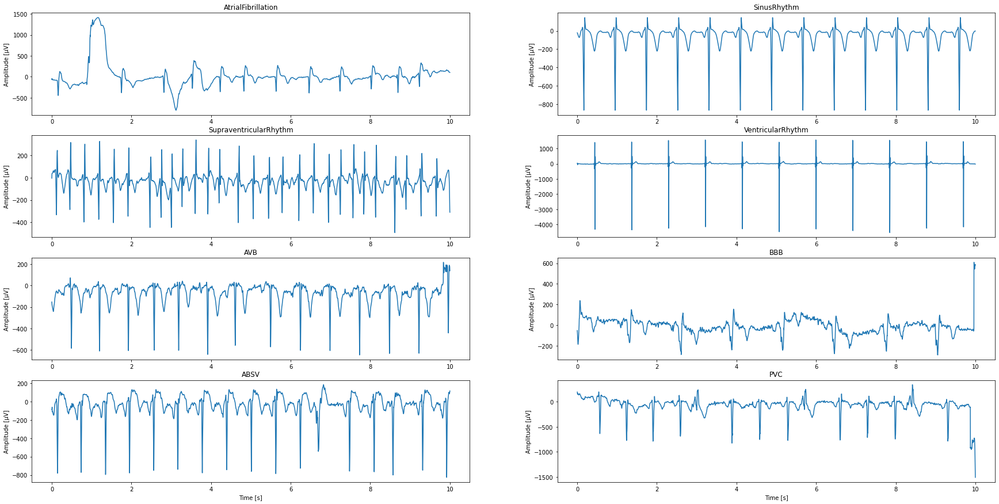

In [0]:
#AF1_PATH=AF_SV_VR_PATH / AF1[0]
#SV1_PATH=AF_SV_VR_PATH / SV1[0]
#VR1_PATH=AF_SV_VR_PATH / VR1[0]

AF2_PATH=AF_SV_VR_PATH / AF2[0]
SI2_PATH=SINUS_PATH / SI2[0]
SV2_PATH=AF_SV_VR_PATH / SV2[0]
VR2_PATH=AF_SV_VR_PATH / VR2[0]
AV1_PATH=AB_AV_BB_PV_PATH / AV1[0]
BB1_PATH=AB_AV_BB_PV_PATH / BB1[0]
AB1_PATH=AB_AV_BB_PV_PATH / AB1[0]
PV1_PATH=AB_AV_BB_PV_PATH / PV1[0]

#AF1_signal=sio.loadmat(AF1_PATH);
#SV1_signal=sio.loadmat(SV1_PATH)
#VR1_signal=sio.loadmat(VR1_PATH);

AF2_signal=sio.loadmat(AF2_PATH)
SI2_signal=sio.loadmat(SI2_PATH)
SV2_signal=sio.loadmat(SV2_PATH)
VR2_signal=sio.loadmat(VR2_PATH)
AV1_signal=sio.loadmat(AV1_PATH);
BB1_signal=sio.loadmat(BB1_PATH)
AB1_signal=sio.loadmat(AB1_PATH);
PV1_signal=sio.loadmat(PV1_PATH)

time_axis=np.linspace(0,10,5000)
plt.figure(figsize=(30,15))
plt.subplot(4, 2, 1)
AF2_signal=AF2_signal['data']
plt.plot(time_axis, (AF2_signal[:,1]))
pyplot.title(labels_names[0])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 2)
SI2_signal=SI2_signal['data']
plt.plot(time_axis, (SI2_signal[:,1]))
pyplot.title(labels_names[1])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 3)
SV2_signal=SV2_signal['data']
plt.plot(time_axis, (SV2_signal[:,1]))
pyplot.title(labels_names[2])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 4)
VR2_signal=VR2_signal['data']
plt.plot(time_axis, (VR2_signal[:,1]))
pyplot.title(labels_names[3])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 5)
AV1_signal=AV1_signal['data']
plt.plot(time_axis, (AV1_signal[:,1]))
pyplot.title(labels_names[5])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 6)
BB1_signal=BB1_signal['data']
plt.plot(time_axis, (BB1_signal[:,1]))
pyplot.title(labels_names[6])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 7)
AB1_signal=AB1_signal['data']
plt.plot(time_axis, (AB1_signal[:,1]))
pyplot.title(labels_names[7])
pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 8)
PV1_signal=PV1_signal['data']
plt.plot(time_axis, (PV1_signal[:,1]))
pyplot.title(labels_names[8])
pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')



##avL

numpy.ndarray

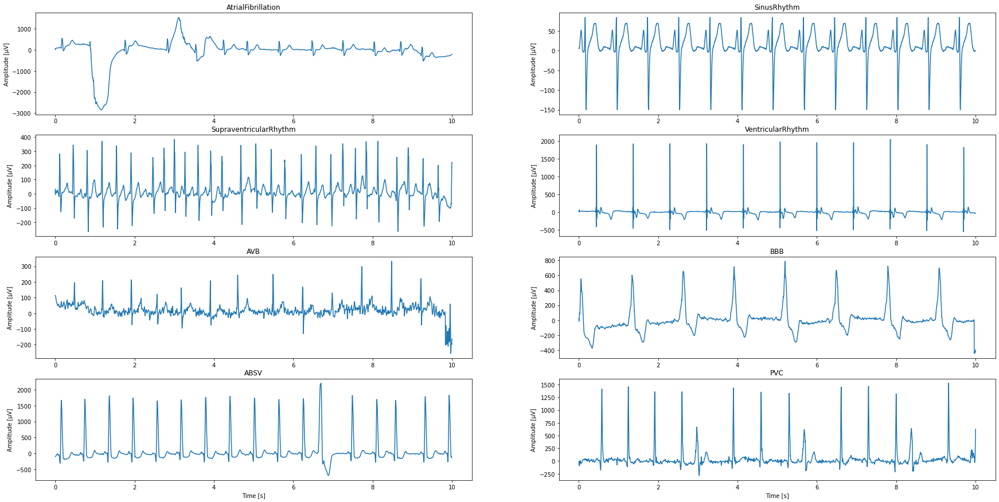

In [0]:
#AF1_PATH=AF_SV_VR_PATH / AF1[0]
#SV1_PATH=AF_SV_VR_PATH / SV1[0]
#VR1_PATH=AF_SV_VR_PATH / VR1[0]

AF2_PATH=AF_SV_VR_PATH / AF2[0]
SI2_PATH=SINUS_PATH / SI2[0]
SV2_PATH=AF_SV_VR_PATH / SV2[0]
VR2_PATH=AF_SV_VR_PATH / VR2[0]
AV1_PATH=AB_AV_BB_PV_PATH / AV1[0]
BB1_PATH=AB_AV_BB_PV_PATH / BB1[0]
AB1_PATH=AB_AV_BB_PV_PATH / AB1[0]
PV1_PATH=AB_AV_BB_PV_PATH / PV1[0]

#AF1_signal=sio.loadmat(AF1_PATH);
#SV1_signal=sio.loadmat(SV1_PATH)
#VR1_signal=sio.loadmat(VR1_PATH);

AF2_signal=sio.loadmat(AF2_PATH)
SI2_signal=sio.loadmat(SI2_PATH)
SV2_signal=sio.loadmat(SV2_PATH)
VR2_signal=sio.loadmat(VR2_PATH)
AV1_signal=sio.loadmat(AV1_PATH);
BB1_signal=sio.loadmat(BB1_PATH)
AB1_signal=sio.loadmat(AB1_PATH);
PV1_signal=sio.loadmat(PV1_PATH)

time_axis=np.linspace(0,10,5000)
plt.figure(figsize=(30,15))
plt.subplot(4, 2, 1)
AF2_signal=AF2_signal['data']
plt.plot(time_axis, (AF2_signal[:,2]))
pyplot.title(labels_names[0])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 2)
SI2_signal=SI2_signal['data']
plt.plot(time_axis, (SI2_signal[:,2]))
pyplot.title(labels_names[1])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 3)
SV2_signal=SV2_signal['data']
plt.plot(time_axis, (SV2_signal[:,2]))
pyplot.title(labels_names[2])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 4)
VR2_signal=VR2_signal['data']
plt.plot(time_axis, (VR2_signal[:,2]))
pyplot.title(labels_names[3])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 5)
AV1_signal=AV1_signal['data']
plt.plot(time_axis, (AV1_signal[:,2]))
pyplot.title(labels_names[5])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 6)
BB1_signal=BB1_signal['data']
plt.plot(time_axis, (BB1_signal[:,2]))
pyplot.title(labels_names[6])
#pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 7)
AB1_signal=AB1_signal['data']
plt.plot(time_axis, (AB1_signal[:,2]))
pyplot.title(labels_names[7])
pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')
plt.subplot(4, 2, 8)
PV1_signal=PV1_signal['data']
plt.plot(time_axis, (PV1_signal[:,2]))
pyplot.title(labels_names[8])
pyplot.xlabel('Time [s]')
pyplot.ylabel('Amplitude [μV]')

type(AF2_signal[:,0])


## Signal loading example

In [0]:
AF2_II=[]
for i in range(len(AF2)):
  AF2_PATH=AF_SV_VR_PATH / AF2[i]
  signal=sio.loadmat(AF2_PATH)
  signal=signal['data']
  AF2_II.append(signal[:,0])

AF2_II=np.asarray(AF2_II)

print(np.shape(AF2_II))

AF2_avR=[]
for i in range(len(AF2)):
  AF2_PATH=AF_SV_VR_PATH / AF2[i]
  signal=sio.loadmat(AF2_PATH)
  signal=signal['data']
  AF2_avR.append(signal[:,1])

AF2_avR=np.asarray(AF2_avR)
print(np.shape(AF2_avR))

AF2_avL=[]
for i in range(len(AF2)):
  AF2_PATH=AF_SV_VR_PATH / AF2[i]
  signal=sio.loadmat(AF2_PATH)
  signal=signal['data']
  AF2_avL.append(signal[:,2])

AF2_avL=np.asarray(AF2_avL)

print(np.shape(AF2_avL))

labels=np.ones((len(AF2),1))

print(np.shape(labels))

(267, 5000)
(267, 5000)
(267, 5000)
(267, 1)


##Saving sinus signals

In [0]:
# load real samples of sinus rhythm
SI2_II=[]
for i in range(len(SI2)):
  SI2_PATH=SINUS_PATH / SI2[i]
  signal=sio.loadmat(SI2_PATH)
  signal=signal['data']
  SI2_II.append(signal[:,0])

SI2_II=np.asarray(SI2_II)
print(np.shape(SI2_II))
np.save(WORKDIR_PATH / "SI2_II_full",SI2_II)


(3350, 5000)


# **Electrocardiogram generation with a bidirectional LSTM-CNN generative adversarial network**
http://www.nature.com/articles/s41598-019-42516-z


### Signal loading arameters

In [0]:
# which signals to load

#subor= "SI2_II.npy"     # start signaly - 3120 samples from start (0-3120)
#subor="SI2_II_end.npy"  # end signaly - 3120 samples till end (1880-5000)
subor="SI2_II_full.npy"  # full signaly - all 5000 samples (0-5000)

## Preprocessing the input data
* Delete signals that does not fall into range [-1500, 2000]
* Clip them to range [1200, 1200] - easily normalized after
* Normalize inputs to the range [-1, 1] and use tanh in the generator output.

In [0]:
#odstranenie nevhodných signálov
clip_value_top=2000
clip_value_bottom=1500

#orezanie signálov
clip_value_top2=1200
clip_value_bottom2=1200

# vzorkovacia frekvenica (aku chceme)
fvz=360 #500 

In [0]:
SI2_II=np.load(WORKDIR_PATH / subor)
SI2_II=np.transpose(SI2_II)
SI2_II=SI2_II.astype('float32') 

print('Data type of SI2 ->          ' + str(SI2_II.dtype))
print('Type of SI2 ->               ' + str(type(SI2_II)))
print('Shape of SI2 ->              ' + str(np.shape(SI2_II)))

#prevzorkovanie signalu

resampled_signals_360=[]
for i in range(SI2_II.shape[1]):
	resampled_signals_360.append(scipy.signal.resample(SI2_II[:,i],3600))
resampled_signals_360=np.asarray(resampled_signals_360)
resampled_signals_360=np.transpose(resampled_signals_360)

print('Signal resampled from 500Hz to 360Hz ->              ' + str(np.shape(resampled_signals_360)))

#skratenie signalu

SI2_II=resampled_signals_360[479:3599,:]
print('Signal shortened from 3600 to 3120 samples ->              ' + str(np.shape(SI2_II)))

number_of_signals = SI2_II.shape[1]
length_of_signal = SI2_II.shape[0]

print('Clip value top of SI2 ->         ' + str(clip_value_top) + 'μV')
print('Clip value bottom of SI2 ->      ' + str(clip_value_bottom) + 'μV')

# orezanie signalov

idx=[]
for i in range (number_of_signals):
  for j in range(length_of_signal):
    if SI2_II[j,i] > clip_value_top:
      idx.append(i)
    elif SI2_II[j,i] < (-clip_value_bottom):
      idx.append(i)

clipped_signals_idx=np.unique(idx)
print('Number of clipped signals -> ' + str(len(clipped_signals_idx)))

SI2_II=np.delete(SI2_II,clipped_signals_idx[:],1)
print('These signals were deleted.')

number_of_signals = SI2_II.shape[1]
length_of_signal = SI2_II.shape[0]
time_axis=np.linspace(0,length_of_signal/fvz,length_of_signal)

print('Clip value top of SI2 ->         ' + str(clip_value_top2) + 'μV')
print('Clip value bottom of SI2 ->      ' + str(clip_value_bottom2) + 'μV')

idx=[]
for i in range (number_of_signals):
  for j in range(length_of_signal):
    if SI2_II[j,i] > clip_value_top2:
      SI2_II[j,i]= clip_value_top2
      idx.append(i)
    elif SI2_II[j,i] < (-clip_value_bottom2):
      SI2_II[j,i]= -clip_value_bottom2
      idx.append(i)

print('Number of SI2 signals ->     ' + str(number_of_signals))
print('Length of SI2 signals ->     ' + str(length_of_signal))
print('Time axis :')
print(time_axis)
print('Time axis length is :' + str(len(time_axis)))
print('Max of SI_II_11 :' + str(np.amax(SI2_II)))
print('Min of SI_II_11 :' + str(np.amin(SI2_II)))

# transformacia dat

SI2_II_zscore=scipy.stats.zscore(SI2_II)
SI2_II_01=(SI2_II - np.amin(SI2_II)) / (np.amax(SI2_II) - np.amin(SI2_II))
SI2_II_11=(SI2_II)/clip_value_top2 #1200

print('Shape of Z_score normalization ->     ' + str(np.shape(SI2_II_zscore)))
print('Shape of 01 normalization ->          ' + str(np.shape(SI2_II_01)))
print('Shape of 11 normalization ->          ' + str(np.shape(SI2_II_11)))  

print('Range of Z_score normalization ->     ' + '[' + str(np.amin(SI2_II_zscore)) + ',' + str(np.amax(SI2_II_zscore))+ ']' )
print('Range of 01 normalization ->          ' + '[' + str(np.amin(SI2_II_01)) + ',' + str(np.amax(SI2_II_01))+ ']' )
print('Range of 11 normalization ->          ' + '[' + str(np.amin(SI2_II_11)) + ',' + str(np.amax(SI2_II_11))+ ']' )  

# noisy

noisy_signals=[]
pure = np.linspace(-1, 1, SI2_II.shape[0])
noise = np.random.normal(0, 0.1, pure.shape)
for i in range(SI2_II.shape[1]):
	noisy_signals.append(SI2_II_11[:,i] + noise)
noisy_signals=np.asarray(noisy_signals)
noisy_signals=noisy_signals.reshape(SI2_II.shape[0],SI2_II.shape[1])

print('Range of noisy signals ->          ' + '[' + str(np.amin(noisy_signals)) + ',' + str(np.amax(noisy_signals))+ ']' )  
print('Shape of noisy_signals ->              ' + str(np.shape(noisy_signals)))

Data type of SI2 ->          float32
Type of SI2 ->               <class 'numpy.ndarray'>
Shape of SI2 ->              (5000, 3350)
Signal resampled from 500Hz to 360Hz ->              (3600, 3350)
Signal shortened from 3600 to 3120 samples ->              (3120, 3350)
Clip value top of SI2 ->         2000μV
Clip value bottom of SI2 ->      1500μV
Number of clipped signals -> 55
These signals were deleted.
Clip value top of SI2 ->         1200μV
Clip value bottom of SI2 ->      1200μV
Number of SI2 signals ->     3295
Length of SI2 signals ->     3120
Time axis :
[0.00000000e+00 2.77866838e-03 5.55733675e-03 ... 8.66110933e+00
 8.66388800e+00 8.66666667e+00]
Time axis length is :3120
Max of SI_II_11 :1200.0
Min of SI_II_11 :-1200.0
Shape of Z_score normalization ->     (3120, 3295)
Shape of 01 normalization ->          (3120, 3295)
Shape of 11 normalization ->          (3120, 3295)
Range of Z_score normalization ->     [-8.92911,10.876356]
Range of 01 normalization ->          [0.0,1.0

## Discriminator

* The sequence comprising ECG data points can be regarded as a time series sequence (a normal image requires both a vertical convolution and a horizontal convolution) rather than an image, so only one-dimensional **(1-D) convolution** need to be involved.

* We assume that an input sequence x1, x2, … xT comprises T points, where each is represented by a d-dimensional vector.
 * teda 3120 bodov, kazdy z nich je reprezentoavany jednym bodom v 5D (laten_dim) 
 * input_shape=(None,3120,5) v generatore (None,3120,1) v diskriminatore

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 601, 10)           1210      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 601, 10)           0         
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 186, 10)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 51, 5)             1805      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 51, 5)             0         
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 10, 5)             0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 50)               

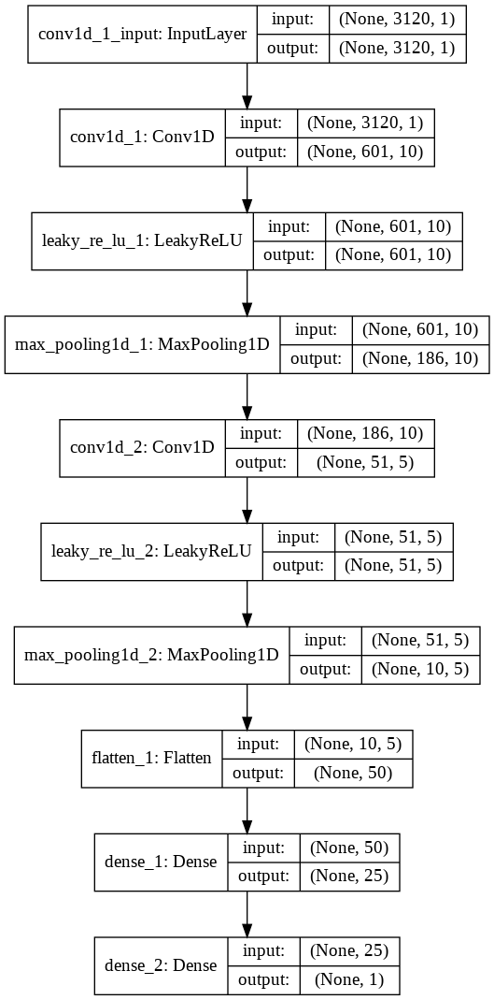

In [0]:
def define_discriminator(input_shape=(3120,1)):
  model = Sequential()
  model.add(Conv1D(input_shape=(3120,1),filters=10, kernel_size=120, strides=5, padding='valid',kernel_initializer='he_normal'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(MaxPooling1D(pool_size=46, strides=3, padding='valid', data_format='channels_last'))
  model.add(Conv1D(filters=5, kernel_size=36, strides=3, padding='valid'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(MaxPooling1D(pool_size=24, strides=3, padding='valid', data_format='channels_last'))
  model.add(Flatten())
  model.add(Dense(25))
  #model.add(Dense(1))
  model.add(Dense(1,activation='sigmoid'))
  # optimalizacny algoritmus
  #adam_D = Adam(lr=0.0002, beta_1=0.5)
  #sgd_D = SGD(lr=0.001) 
  sgd_D = SGD(lr=0.0001) 
  #sgd_d = SGD(lr=0.00001)
  model.compile(loss='binary_crossentropy', optimizer=sgd_D, metrics=['accuracy'])
  return model

# zostavenie diskriminátoru
discriminator_model = define_discriminator()


# summarize the model
discriminator_model.summary()
# plot the model
plot_model(discriminator_model, to_file='discriminator_plot.png', show_shapes=True, show_layer_names=True)

# model.add(Conv1D(input_shape=(3120,1),filters=10, kernel_size=120, strides=5, padding='valid', data_format='channels_last', dilation_rate=1, 
#                  activation=None, use_bias=True, kernel_initializer='he_normal', bias_initializer='zeros', kernel_regularizer=None, 
#                  bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(BatchNormalization())

# model.add(Conv1D(filters=5, kernel_size=36, strides=3, padding='valid', data_format='channels_last', dilation_rate=1, 
#                  activation=None, use_bias=True, kernel_initializer='he_normal', bias_initializer='zeros', 
#                  kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))

#NOTES:

# BCEWithLogitsLoss() and Sigmoid() doesn't work together, because BCEWithLogitsLoss() includes the Sigmoid activation. 
# So you can use BCEWithLogitsLoss() without Sigmoid() or you can use Sigmoid() and BCELoss()

# OPTIMALIZATION OPTIONS:

# 0 inicializacia
# 1 Use label smoothing in the discriminator, with small random noise.  
# 2 Add random noise to the labels in the discriminator.
# 3 Add noise to inputs to the discriminator and decay the noise over time.
# 4 Optimalizer / paper= SGD a mini-batch o dlzke 100 / adam je v GANoch standart
#   sgd = SGD(lr=0.00001)
#   adam = Adam(lr=0.0002, beta_1=0.5)
# 5 Remove Fully-Connected Layers
# 6 Use ReLU, Leaky ReLU, and Tanh
# 7 Kernel size, filters, strides

## Generator

*  series of noise data points that follow a Gaussian distribution are fed into the generator as a fixed length sequence. We assume that each noise point can be represented as a d-dimensional **?one-hot vector?** and the length of the sequence is T. Thus, the size of the input matrix is **T × d.** 

* To prevent slow gradient descent due to parameter inflation in the generator, we add a dropout layer and set the probability to 0.5. 

* The generator produces data based on the noise data sampled from a Gaussian distribution, which is **fitted to the real data distribution as accurately as possible.**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Update your `LSTM` call to the Keras 2 API: `LSTM(100, return_sequences=True, activation="tanh", kernel_initializer="glorot_normal")`
  This is separate from the ipykernel package so we can avoid doing imports until


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_1 (Bidirection (None, 3120, 100)         84800     
_________________________________________________________________
bidirectional_2 (Bidirection (None, 3120, 100)         160800    
_________________________________________________________________
dropout_1 (Dropout)          (None, 3120, 100)         0         
_________________________________________________________________
dense_3 (Dense)              (None, 3120, 1)           101       
Total params: 245,701
Trainable params: 245,701
Non-trainable params: 0
_________________________________________________________________


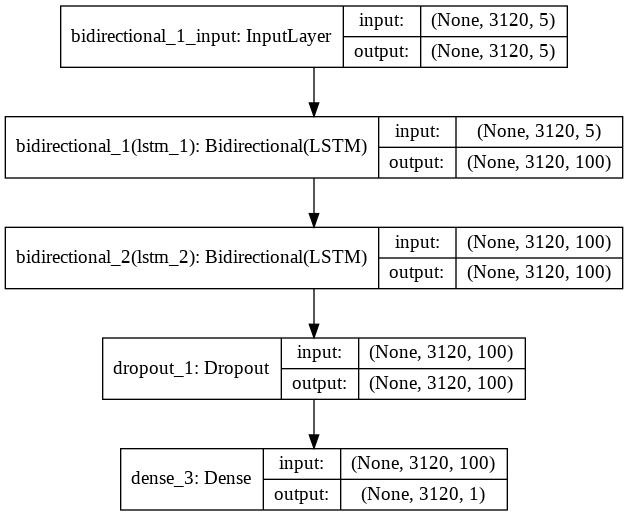

In [0]:
def define_generator(latent_dim):
  model = Sequential()
  model.add(Bidirectional(LSTM(100, return_sequences=True,init='glorot_normal',activation='tanh'), input_shape=(3120,latent_dim), merge_mode='sum'))
  #model.add(LeakyReLU(alpha=0.2))
  model.add(Bidirectional(LSTM(100, return_sequences=True,activation='tanh'),merge_mode='sum'))
  #model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.5, noise_shape=None, seed=None))
  #model.add(Dense(1))
  model.add(Dense(1, activation='tanh'))
  return model

# size of the latent space
latent_dim =5
# define the generator model
generator_model = define_generator(latent_dim)
# summarize the model
generator_model.summary()
# plot the model
plot_model(generator_model, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

# model.add(Bidirectional(LSTM(100, activation='tanh', recurrent_activation='tanh', use_bias=True, kernel_initializer='random_normal', 
# recurrent_initializer='zeros', bias_initializer='zeros', unit_forget_bias=True, kernel_regularizer=None, recurrent_regularizer=None, 
# bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, recurrent_constraint=None, bias_constraint=None, dropout=0.0, 
# recurrent_dropout=0.0, implementation=2, return_sequences=True, 
# return_state=False, go_backwards=False, stateful=False, unroll=False),input_shape=(3120,latent_dim), merge_mode='sum'))
# return_sequences: Boolean. Whether to return the last output in the output sequence, or the full sequence.

#model.add(Bidirectional(LSTM(100, activation='tanh', recurrent_activation='tanh', use_bias=True, kernel_initializer='random_normal', 
#recurrent_initializer='zeros', bias_initializer='zeros', unit_forget_bias=True, kernel_regularizer=None, recurrent_regularizer=None, 
#bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, recurrent_constraint=None, bias_constraint=None, dropout=0.0, 
#recurrent_dropout=0.0, implementation=2, return_sequences=True, 
#return_state=False, go_backwards=False, stateful=False, unroll=False),merge_mode='sum'))

#latent space method 2

#model.add(Dense(3120*latent_dim, input_dim=latent_dim))
#model.add(LeakyReLU(alpha=0.2))
#model.add(Reshape((3120, latent_dim)))
#model.add(Bidirectional(LSTM(100, return_sequences=True,input_shape=(3120,latent_dim)), merge_mode='sum')) # input_shape=(batch_size,3120,latent_dim)

# NOTES:

# 1 Return sequences - TRUE
# 2 Use dropout of 50 percent during train and generation. - ALREADY USING
# 3 Normalize inputs to the range [-1, 1] and use tanh in the generator output. - DONE
# 4 LSTMs are sensitive to the scale of the input data, specifically when the sigmoid (default) or tanh activation functions are used. 
#   It can be a good practice to rescale the data to the range of 0-to-1, also called normalizing. ” alebo [-1,1] ak mam tanh

# OPTIMALIZATION OPTIONS:

# 1 Use Leaky ReLU in the generator and discriminator.
# 2 The best practice for DCAGAN models reported in the paper is to initialize all weights using 
#   a zero-centered Gaussian distribution (the normal or bell-shaped distribution) with a standard deviation of 0.02.

## Possible tuning


### https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/

### TIPS AND TRICKS:

*   Add random noise to the labels in the discriminator.
*   Add noise to inputs to the discriminator and decay the noise over time.

### ALREADY TRIED:

*   Use label smoothing in the discriminator, with small random noise.**DONE**
*   Use labels if you have them.**DONE**
*   Use dropout of 50 percent during train and generation. **DONE**
*   Normalize inputs to the range [-1, 1] and use tanh in the generator output. - **DONE**
*   Flip the labels and loss function when training the generator. - **DONE**
*   Sample Gaussian random numbers as input to the generator. - **DONE**
*   Use Leaky ReLU in the generator and discriminator. **DONE**
*   Use Average pooling and stride for downsampling; use ConvTranspose2D and stride for upsampling. **MAX POOLING, CONV1D**



## Generating fake and real signals



Mean of SI2_II_11_mean :
0.06107788
Std of SI2_II_11_mean :
0.12267831
Latent space points shape:
(5, 3120, 5)
Latent space 5 dimensions, 3120 samples : 
[[[ 0.14295202 -0.07332388  0.00090022  0.10171345 -0.16075791]
  [-0.14413946  0.12035475 -0.17992044  0.03781225  0.29940104]
  [-0.04213467  0.06360403 -0.09093549 -0.25468497  0.02073235]
  ...
  [ 0.21084658 -0.0357239  -0.10012019  0.27172281  0.02936474]
  [ 0.00292403  0.1159197   0.05924992  0.35093395  0.05620049]
  [-0.03874435  0.08461494  0.1433038  -0.12056323 -0.30504946]]

 [[ 0.11937554  0.06135249  0.04847444  0.08828704  0.20748281]
  [ 0.15715128  0.07123035  0.03043929 -0.02627336  0.30085415]
  [ 0.21376771  0.16609751  0.27936374  0.06907546  0.13867512]
  ...
  [ 0.078341    0.16203164  0.16439833 -0.17256012  0.0419608 ]
  [ 0.08783189  0.22335794  0.2701222  -0.01676234  0.02316467]
  [ 0.04134502  0.10022636  0.03532402  0.00823475 -0.13533207]]

 [[ 0.01769212  0.02434844 -0.0816114   0.12415181  0.06716255

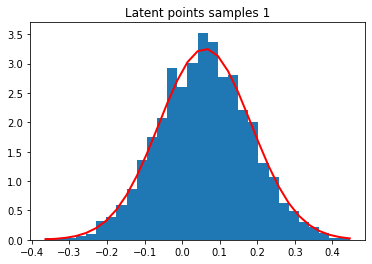

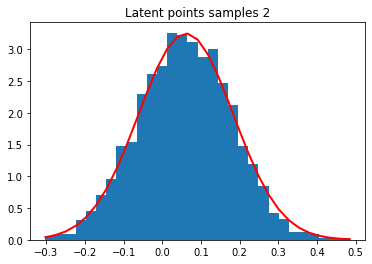

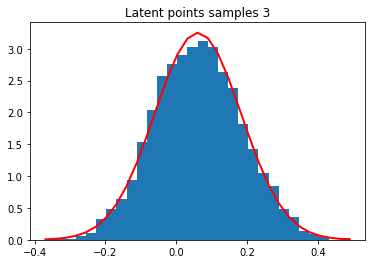

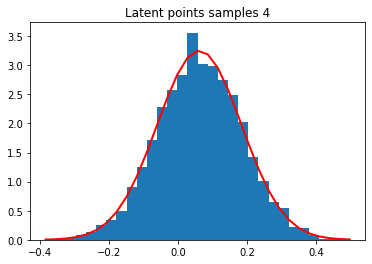

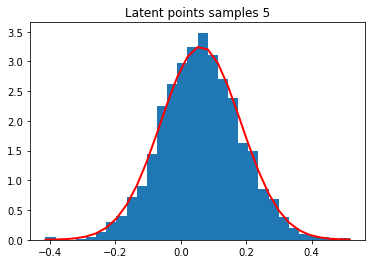

Fake data points shape:
(5, 3120, 1)
Fake data  points [0]:
[ 0.01293988  0.01272533  0.01256456 ... -0.02579545 -0.03244355
 -0.03134092]


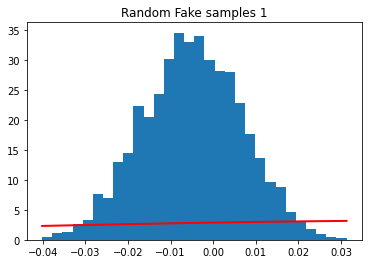

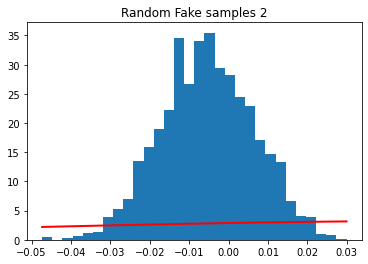

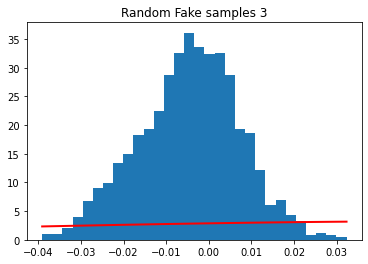

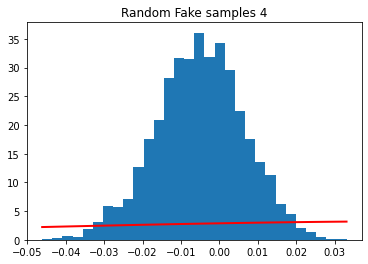

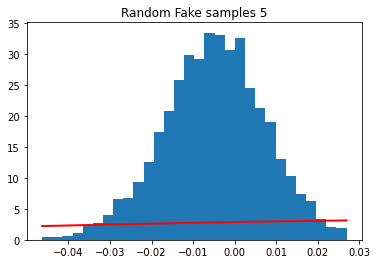

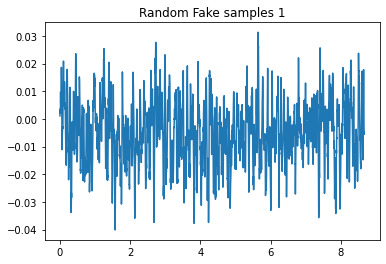

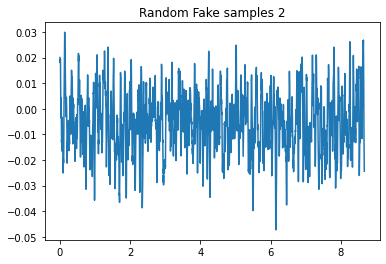

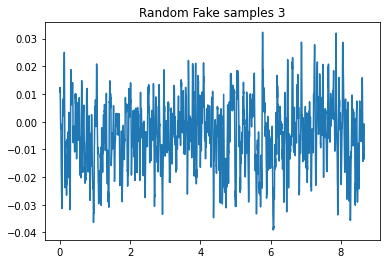

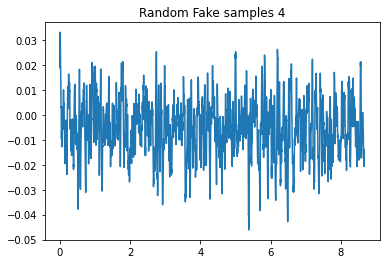

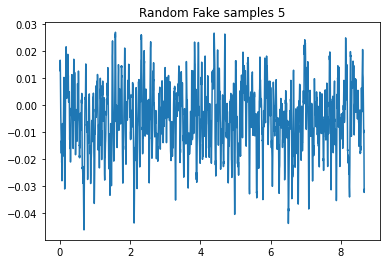

Real data points shape:
(5, 3120, 1)
Real data  points [0]:
[[-0.01055283]
 [-0.00991141]
 [-0.01011496]
 ...
 [ 0.03884206]
 [ 0.04037906]
 [ 0.02903617]]
Length of Real data  points [0]:
3120


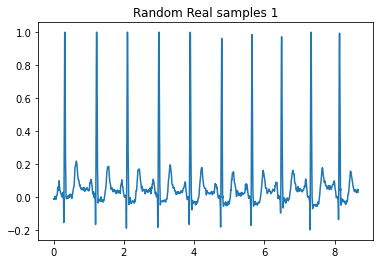

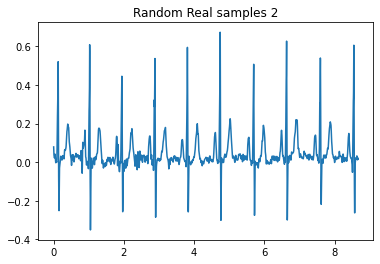

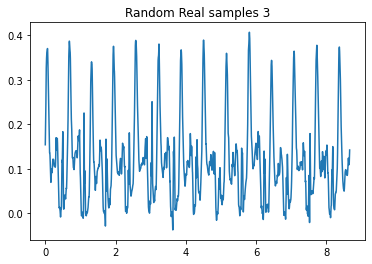

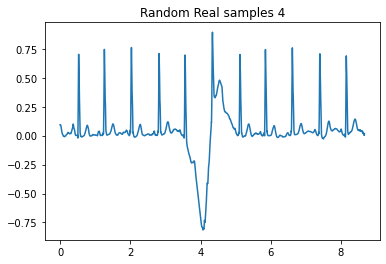

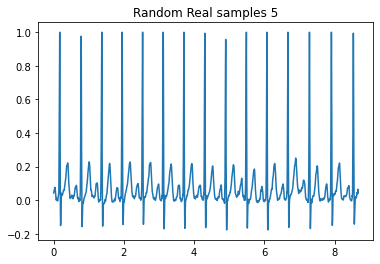

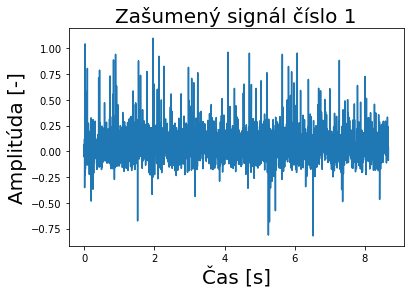

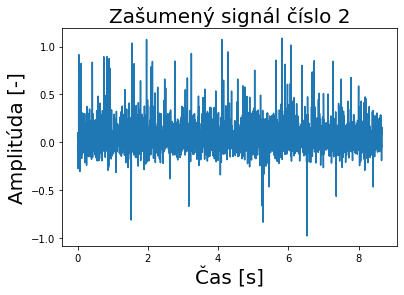

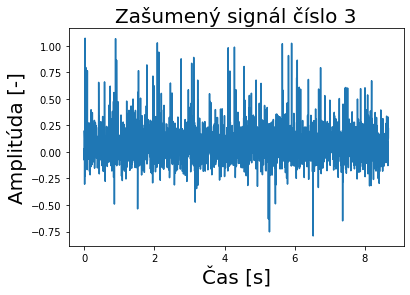

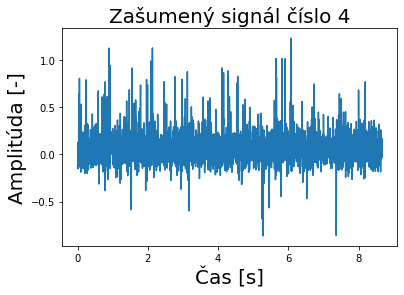

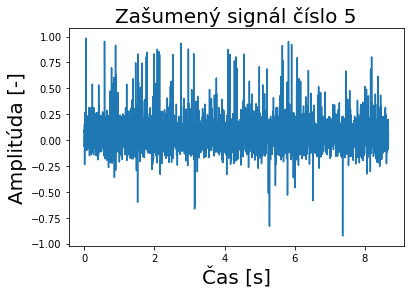

In [0]:
# generovanie latentnych bodov

def generate_latent_points(latent_dim,batch_size,mu,sigma):
  # generate points in the latent space
  latent_points = np.random.normal(mu,sigma, size=(3120 * latent_dim * batch_size))
  latent_points=latent_points.reshape(batch_size,length_of_signal,latent_dim) #batch x 3120 x 5
  return latent_points


# generovanie falosnych signalov

def generate_fake_samples(generator, latent_dim, batch_size,mu,sigma):
  # generovanie latentnych bodov
  X = generate_latent_points(latent_dim, batch_size,mu,sigma)
  x_input = generator_model.predict(X)
  # label smoothing - intervalove oznacenia skupin
  label=[]
  for i in range(batch_size):
    y = np.round(random.uniform(0, 0.1),2)
    label.append(y)
  label=np.asarray(label)
  y=label.reshape(batch_size,1)
  #y = np.zeros((batch_size,1))
  return x_input,y

# generovanie realnych signalov

def generate_real_samples(batch_size,signal):
  label=[]
  X=[]
  #nahodne cislo signalu
  for i in range (batch_size):
    cislo_signalu=random.randint(0, signal.shape[1]-1)
    X.append(signal[:,cislo_signalu])
  X=np.asarray(X)
  X=X.reshape(batch_size,length_of_signal,1)

  # label smoothing - intervalove oznacenia skupin
  for i in range(batch_size):
    y = np.round(random.uniform(0.9, 1),2)
    label.append(y)
  label=np.asarray(label)
  y=label.reshape(batch_size,1)
  #y = np.ones((batch_size,1))
  return X,y 

# statistiky signalu pre specificke rozlozenie

SI2_II_11_mean=np.mean(np.mean(SI2_II_11, axis=0))
SI2_II_11_std=np.std(SI2_II_11)
time_axis=np.linspace(0,length_of_signal/360,length_of_signal)

print('Mean of SI2_II_11_mean :')
print(SI2_II_11_mean)
print('Std of SI2_II_11_mean :')
print(SI2_II_11_std)  

latent_points=generate_latent_points(latent_dim=5,batch_size=5,mu=SI2_II_11_mean,sigma=SI2_II_11_std)
print('Latent space points shape:')
print(np.shape(latent_points))
print('Latent space 5 dimensions, 3120 samples : ')
print(latent_points)

#plot latent points

for i in range(5): 
  count, bins, ignored = plt.hist(latent_points[i][:,0], 30, density=True)
  plt.plot(bins, 1/(SI2_II_11_std * np.sqrt(2 * np.pi))*np.exp( - (bins - SI2_II_11_mean)**2 / (2 * SI2_II_11_std**2) ), linewidth=2, color='r')
  pyplot.title('Latent points samples'+ ' '+ str(i+1))
  plt.show()

# falosne signaly

fake_data,y = generate_fake_samples(generator_model, latent_dim=5,batch_size=5, mu=SI2_II_11_mean, sigma=SI2_II_11_std)

print('Fake data points shape:')
print(np.shape(fake_data))
print('Fake data  points [0]:')
print(fake_data[i][:,0])

# plot rozlozenia falosnych signalov

for i in range(5): 
  count, bins, ignored = plt.hist(fake_data[i][:,0], 30, density=True)
  plt.plot(bins, 1/(SI2_II_11_std * np.sqrt(2 * np.pi))*np.exp( - (bins - SI2_II_11_mean)**2 / (2 * SI2_II_11_std**2) ), linewidth=2, color='r')
  pyplot.title('Random Fake samples'+ ' '+ str(i+1))
  plt.show()

# plot falosnych signalov

for i in range(5): 
  # plot samples
  plt.plot(time_axis, fake_data[i][:,0])
  pyplot.title('Random Fake samples'+ ' '+ str(i+1)) 
  pyplot.show()

# realne signaly

real_data,y = generate_real_samples(5,SI2_II_11)

print('Real data points shape:')
print(np.shape(real_data))
print('Real data  points [0]:')
print(real_data[0])
print('Length of Real data  points [0]:')
print(len(real_data[0]))

# plot realnych signalov

for i in range(5): 
  plt.plot(time_axis, real_data[i])
  pyplot.title('Random Real samples'+ ' '+ str(i+1)) 
  pyplot.show()

# zasumene signaly

for i in range(5): 
  plt.plot(time_axis, noisy_signals[:,i])
  pyplot.title('Zašumený signál číslo'+ ' '+ str(i+1),fontsize=20) 
  pyplot.xlabel('Čas [s]',fontsize=20)
  pyplot.ylabel('Amplitúda [-]',fontsize=20) 
  pyplot.show()

### **As the generator has not been trained, the generated points are complete rubbish, as we expect, but we can imagine that as the model is trained, these points will slowly begin to resemble signal.**

## Testing the discriminator

When the discriminator is good at detecting fake samples, the generator is updated more, and when the discriminator model is relatively poor or confused when detecting fake samples, the generator model is updated less.

Therefore, in GAN cases, you don't want D loss to go to zero because that would mean that D is doing a too good job (and most importantly, G a too bad one), ie it can easily discriminate between fake and real data (ie G's creations are not close enough to real data).

In [0]:
start = timer()

# vytvorenie trenovacej a testovacej databazy 80/20 
number_of_train_signals=int(np.round(number_of_signals*0.8))
SI2_II_11_train=SI2_II_11[:,0:number_of_train_signals]
SI2_II_11_test=SI2_II_11[:,number_of_train_signals:number_of_signals]

print('Shape of TRAIN SI2 signals->     ' + str(np.shape(SI2_II_11_train)))
print('Shape of TEST SI2 signals ->     ' + str(np.shape(SI2_II_11_test)))
print('Shape of NOISY SI2 signals ->     ' + str(np.shape(noisy_signals)))
	
# testovanie diskriminatora

def test_discriminator(model,train_signals,test_signals,SI2_II_11_mean,SI2_II_11_std, n_iters, batch_size):

	half_batch = int(batch_size / 2)
 
	for i in range(n_iters):

		# realne signaly
		x_real_train, y_real_train = generate_real_samples(half_batch,train_signals)   #50 train real
		x_real_test, y_real_test = generate_real_samples(half_batch,test_signals)			 #50 test real

		# trening diskriminatora
		train_loss, train_acc = model.train_on_batch(x_real_train, y_real_train)
	
		# falosne zasumene signaly
		x_fake,_=generate_real_samples(half_batch,noisy_signals)	#50 noisy
		_, y_fake = generate_fake_samples(generator_model, latent_dim, half_batch, SI2_II_11_mean, SI2_II_11_std) #oznacenia chceme fake=0

		# # falosne signaly z generatoru
		# x_fake, y_fake = generate_fake_samples(generator_model, latent_dim, half_batch, SI2_II_11_mean, SI2_II_11_std)		 #50 fake 

		# update discriminator on fake/noisy samples
		loss_fake, fake_acc = model.train_on_batch(x_fake, y_fake)
	
		print('>%d train_acc=%.0f%% fake_acc=%.0f%% 		train_loss=%f fake_loss=%f' % (i+1, train_acc*100, fake_acc*100, train_loss, loss_fake))
		train_acc_graph.append(train_acc)
		train_loss_graph.append(train_loss)
		fake_acc_graph.append(fake_acc)
		loss_fake_graph.append(loss_fake)


train_acc_graph=[]
fake_acc_graph=[]
train_loss_graph=[]
loss_fake_graph=[]

# vytvorenie diskriminatoru
discriminator_model = define_discriminator(input_shape=(3120,1))
# testovanie diskriminatoru
test_discriminator(discriminator_model,SI2_II_11_train,SI2_II_11_test,SI2_II_11_mean,SI2_II_11_std, 200, 200)

end = timer()
print('Time of training:') 
print(end - start) #1232.347090326 200 iteracii

np.save(WORKDIR_PATH / "train_acc_graph",train_acc_graph)
np.save(WORKDIR_PATH / "fake_acc_graph",fake_acc_graph)
np.save(WORKDIR_PATH / "train_loss_graph",train_loss_graph)
np.save(WORKDIR_PATH / "loss_fake_graph",loss_fake_graph)


Shape of TRAIN SI2 signals->     (3120, 2636)
Shape of TEST SI2 signals ->     (3120, 659)
Shape of NOISY SI2 signals ->     (3120, 3295)
>1 train_acc=8% fake_acc=0% 		train_loss=0.524671 fake_loss=1.010266
>2 train_acc=6% fake_acc=0% 		train_loss=0.525447 fake_loss=0.997917
>3 train_acc=7% fake_acc=0% 		train_loss=0.529887 fake_loss=1.003675
>4 train_acc=6% fake_acc=0% 		train_loss=0.521513 fake_loss=1.021679
>5 train_acc=3% fake_acc=0% 		train_loss=0.514480 fake_loss=0.987392
>6 train_acc=5% fake_acc=0% 		train_loss=0.520356 fake_loss=0.989286
>7 train_acc=6% fake_acc=0% 		train_loss=0.529307 fake_loss=0.993708
>8 train_acc=3% fake_acc=0% 		train_loss=0.533732 fake_loss=1.000822
>9 train_acc=3% fake_acc=0% 		train_loss=0.513234 fake_loss=0.991916
>10 train_acc=5% fake_acc=0% 		train_loss=0.545255 fake_loss=0.973997
>11 train_acc=6% fake_acc=0% 		train_loss=0.533481 fake_loss=0.967047
>12 train_acc=4% fake_acc=0% 		train_loss=0.543379 fake_loss=0.972314
>13 train_acc=5% fake_acc=0% 		

### Analyze discriminator performance
* When things are working, D loss has low variance and goes down over time vs having huge variance and spiking
if loss of generator steadily decreases, then it's fooling D with garbage (says martin)


* Therefore, in GAN cases, you don't want D loss to go to zero because that would mean that D is doing a too good job (and most importantly, G a too bad one), ie it can easily discriminate between fake and real data (ie G's creations are not close enough to real data).


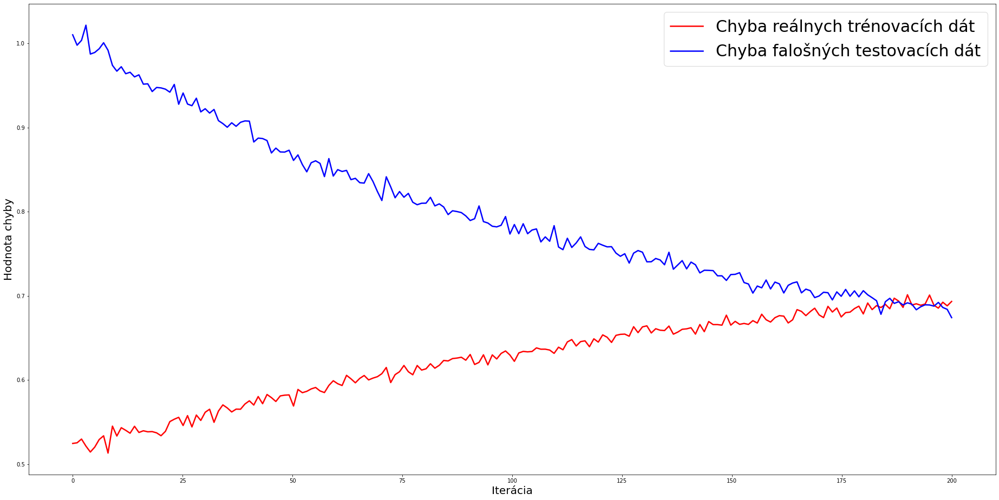

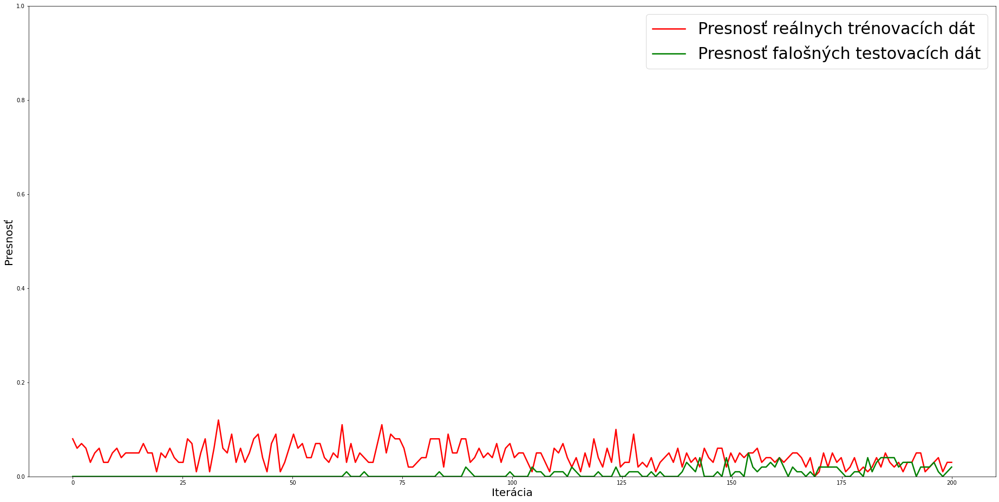

In [0]:
train_acc_graph=np.load(WORKDIR_PATH / "train_acc_graph.npy")
fake_acc_graph=np.load(WORKDIR_PATH / "fake_acc_graph.npy")

train_loss_graph=np.load(WORKDIR_PATH / "train_loss_graph.npy")
loss_fake_graph=np.load(WORKDIR_PATH / "loss_fake_graph.npy")

# filtered_acc_real2 = [ item for i,item in enumerate(d_real_acc_graph2) if i%100==0 ]
# filtered_acc_fake2 = [ item for i,item in enumerate(d_fake_acc_graph2) if i%100==0 ]

iterations=int(np.array(np.shape(train_acc_graph)))

time_axis=np.linspace(0,iterations,iterations)
fig = plt.figure(figsize=(32,16))
mysignals = [{'name': 'Chyba reálnych trénovacích dát', 'x': time_axis, 'y': train_loss_graph[:], 'color':'r', 'linewidth':2.5},{'name': 'Chyba falošných testovacích dát', 'x': time_axis, 'y': loss_fake_graph[:], 'color':'b', 'linewidth':2.5}]
for signal in mysignals:
  #ax1 = fig.add_subplot(n, n, 1 + i)
  plt.plot(signal['x'],signal['y'], color=signal['color'], linewidth=signal['linewidth'], label=signal['name'])
  #ax1.axis('off')
  plt.legend(loc='upper right',prop={'size': 30})
  plt.xlabel('Iterácia',fontsize=20)
  plt.ylabel('Hodnota chyby',fontsize=20)
 
fig = plt.figure(figsize=(32,16))
mysignals = [{'name': 'Presnosť reálnych trénovacích dát', 'x': time_axis, 'y': train_acc_graph[:], 'color':'r', 'linewidth':2.5},{'name': 'Presnosť falošných testovacích dát', 'x': time_axis, 'y': fake_acc_graph[:], 'color':'g', 'linewidth':2.5}]
for signal in mysignals:
  #ax1 = fig.add_subplot(n, n, 1 + i)
  plt.plot(signal['x'],signal['y'], color=signal['color'], linewidth=signal['linewidth'], label=signal['name'])
  #ax1.axis('off')
  #ax1.axis('off')
  plt.legend(loc='upper right',prop={'size': 30})
  plt.xlabel('Iterácia',fontsize=20)
  plt.ylabel('Presnosť',fontsize=20)
  plt.ylim(0,1)

## Submodel for generator training

* Specifically, a new GAN model can be defined that stacks the generator and discriminator such that the generator receives as input random points in the latent space, generates samples that are fed into the discriminator model directly, classified, and the output of this larger model can be used to update the model weights of the generator.

* To be clear, we are not talking about a new third model, just a logical third model that uses the already-defined layers and weights from the standalone generator and discriminator models.

* The generator model is only concerned with the discriminator’s performance on fake examples. Therefore, we will mark all of the layers in the discriminator as not trainable when it is part of the GAN model so that they can not be updated and overtrained on fake examples.

* When training the generator via this subsumed GAN model, there is one more important change. We want the discriminator to think that the samples output by the generator are real, not fake. Therefore, when the generator is trained as part of the GAN model, we will mark the generated samples as real (class 1).

* We can imagine that the discriminator will then classify the generated samples as not real (class 0) or a low probability of being real (0.3 or 0.5). The backpropagation process used to update the model weights will see this as a large error and will update the model weights (i.e. only the weights in the generator) to correct for this error, in turn making the generator better at generating plausible fake samples.

Gan model summary :
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_12 (Sequential)   (None, 3120, 1)           245701    
_________________________________________________________________
sequential_11 (Sequential)   (None, 1)                 4316      
Total params: 250,017
Trainable params: 245,701
Non-trainable params: 4,316
_________________________________________________________________
Gan model plot: 


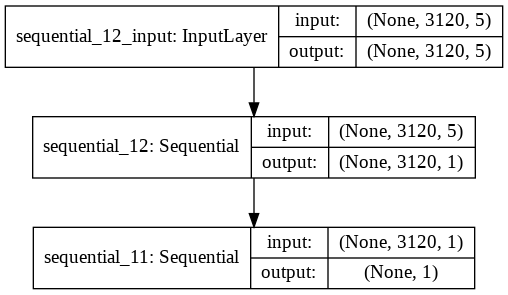

In [0]:
# submodel pre trenovanie generatoru

def define_gan(generator, discriminator):
	# zmrazenie vah diskriminatoru
	discriminator.trainable = False
	# prepojenie modelov
	model = Sequential()
	model.add(generator)
	model.add(discriminator)
	# optimalizacny algoritmus generatoru
	#adam = Adam(lr=0.0002, beta_1=0.5)
	#sgd = SGD(lr=0.001) 
	sgd = SGD(lr=0.0001) 
	#sgd = SGD(lr=0.00001)
	model.compile(loss='binary_crossentropy', optimizer=sgd)
	return model

# vytvorenie submodelu
gan_model = define_gan(generator_model, discriminator_model)

# summarize gan model
print('Gan model summary :')
gan_model.summary()
# plot gan model
print('Gan model plot: ')
plot_model(gan_model, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

## Training GAN - complete model

### Notes from EKG paper:

*  Each model was trained for **500 epochs** with a **mini-batch size of 100**, where the length of the sequence comprised a series of ECG 3120 points and the learning rate was **1 × 10−5.** 

*  The dim for the noise data points was set to **5** and the **length of the generated ECGs was 400.** 

The discriminator model is updated twice per batch, once with real samples and once with fake samples, which is a best practice as opposed to combining the samples and performing a single update.

Finally, we report the loss each batch. It is critical to keep an eye on the loss over batches. The reason for this is that a crash in the discriminator loss indicates that the generator model has started generating rubbish examples that the discriminator can easily discriminate.

Monitor the discriminator loss and expect it to hover around 0.5 to 0.8 per batch. The generator loss is less critical and may hover between 0.5 and 2 or higher.

For example, I came across: Make the discriminator much less expressive by using a smaller model. Generation is a much harder task and requires more parameters, so the generator should be significantly bigger. [1]

Shape of TRAIN SI2 signals->     (3120, 2636)
Shape of TEST SI2 signals ->     (3120, 659)
Mean of SI2_II_11_train_mean :
0.060996685
Std of SI2_II_11_train_std :
0.11372057


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Update your `LSTM` call to the Keras 2 API: `LSTM(100, return_sequences=True, activation="tanh", kernel_initializer="glorot_normal")`
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>1, 1/16, d_real=2% d_fake=0%     		d_loss=1.267926  g_loss=0.686714
>1, 2/16, d_real=6% d_fake=0%     		d_loss=1.243698  g_loss=0.679646
>1, 3/16, d_real=9% d_fake=0%     		d_loss=1.263232  g_loss=0.677553
>1, 4/16, d_real=6% d_fake=0%     		d_loss=1.262207  g_loss=0.673850
>1, 5/16, d_real=5% d_fake=0%     		d_loss=1.245332  g_loss=0.669698
>1, 6/16, d_real=3% d_fake=0%     		d_loss=1.253584  g_loss=0.665765
>1, 7/16, d_real=3% d_fake=0%     		d_loss=1.247143  g_loss=0.662569
>1, 8/16, d_real=7% d_fake=0%     		d_loss=1.246643  g_loss=0.660786
>1, 9/16, d_real=8% d_fake=0%     		d_loss=1.226948  g_loss=0.656781
>1, 10/16, d_real=3% d_fake=0%     		d_loss=1.246707  g_loss=0.654356
>1, 11/16, d_real=5% d_fake=0%     		d_loss=1.230378  g_loss=0.650436
>1, 12/16, d_real=7% d_fake=0%     		d_loss=1.230301  g_loss=0.648260
>1, 13/16, d_real=5% d_fake=0%     		d_loss=1.236333  g_loss=0.646302
>1, 14/16, d_real=2% d_fake=0%     		d_loss=1.208340  g_loss=0.644815
>1, 15/16, d_real=3% d_fake=0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>3, 1/16, d_real=2% d_fake=0%     		d_loss=1.188499  g_loss=0.611039
>3, 2/16, d_real=6% d_fake=0%     		d_loss=1.184602  g_loss=0.610466
>3, 3/16, d_real=3% d_fake=0%     		d_loss=1.182337  g_loss=0.608387
>3, 4/16, d_real=4% d_fake=0%     		d_loss=1.186651  g_loss=0.607895
>3, 5/16, d_real=4% d_fake=0%     		d_loss=1.175627  g_loss=0.605276
>3, 6/16, d_real=11% d_fake=0%     		d_loss=1.175576  g_loss=0.603819
>3, 7/16, d_real=5% d_fake=0%     		d_loss=1.185440  g_loss=0.602933
>3, 8/16, d_real=3% d_fake=0%     		d_loss=1.161424  g_loss=0.601645
>3, 9/16, d_real=4% d_fake=0%     		d_loss=1.155838  g_loss=0.600207
>3, 10/16, d_real=1% d_fake=0%     		d_loss=1.166412  g_loss=0.599610
>3, 11/16, d_real=8% d_fake=0%     		d_loss=1.168530  g_loss=0.597675
>3, 12/16, d_real=4% d_fake=0%     		d_loss=1.165040  g_loss=0.596145
>3, 13/16, d_real=4% d_fake=0%     		d_loss=1.146682  g_loss=0.594890
>3, 14/16, d_real=6% d_fake=0%     		d_loss=1.163485  g_loss=0.593725
>3, 15/16, d_real=4% d_fake=

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>5, 1/16, d_real=1% d_fake=0%     		d_loss=1.111355  g_loss=0.568741
>5, 2/16, d_real=5% d_fake=0%     		d_loss=1.125351  g_loss=0.566199
>5, 3/16, d_real=5% d_fake=0%     		d_loss=1.107766  g_loss=0.565955
>5, 4/16, d_real=8% d_fake=0%     		d_loss=1.121462  g_loss=0.563369
>5, 5/16, d_real=7% d_fake=0%     		d_loss=1.121574  g_loss=0.562874
>5, 6/16, d_real=3% d_fake=0%     		d_loss=1.107966  g_loss=0.561913
>5, 7/16, d_real=2% d_fake=0%     		d_loss=1.105503  g_loss=0.560890
>5, 8/16, d_real=3% d_fake=0%     		d_loss=1.106186  g_loss=0.559428
>5, 9/16, d_real=6% d_fake=0%     		d_loss=1.101624  g_loss=0.556908
>5, 10/16, d_real=8% d_fake=0%     		d_loss=1.117300  g_loss=0.555457
>5, 11/16, d_real=3% d_fake=0%     		d_loss=1.121997  g_loss=0.554935
>5, 12/16, d_real=6% d_fake=0%     		d_loss=1.101641  g_loss=0.552693
>5, 13/16, d_real=5% d_fake=0%     		d_loss=1.097994  g_loss=0.551985
>5, 14/16, d_real=4% d_fake=0%     		d_loss=1.108668  g_loss=0.549572
>5, 15/16, d_real=1% d_fake=0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>7, 1/16, d_real=1% d_fake=0%     		d_loss=1.074251  g_loss=0.523982
>7, 2/16, d_real=6% d_fake=0%     		d_loss=1.085078  g_loss=0.523793
>7, 3/16, d_real=2% d_fake=0%     		d_loss=1.073033  g_loss=0.521724
>7, 4/16, d_real=5% d_fake=0%     		d_loss=1.097435  g_loss=0.520192
>7, 5/16, d_real=4% d_fake=0%     		d_loss=1.092748  g_loss=0.518890
>7, 6/16, d_real=8% d_fake=0%     		d_loss=1.083515  g_loss=0.516680
>7, 7/16, d_real=8% d_fake=0%     		d_loss=1.093949  g_loss=0.515504
>7, 8/16, d_real=4% d_fake=0%     		d_loss=1.075813  g_loss=0.514609
>7, 9/16, d_real=3% d_fake=0%     		d_loss=1.104010  g_loss=0.513385
>7, 10/16, d_real=5% d_fake=0%     		d_loss=1.111698  g_loss=0.511728
>7, 11/16, d_real=5% d_fake=0%     		d_loss=1.087000  g_loss=0.510048
>7, 12/16, d_real=3% d_fake=0%     		d_loss=1.069393  g_loss=0.508121
>7, 13/16, d_real=5% d_fake=0%     		d_loss=1.080280  g_loss=0.507203
>7, 14/16, d_real=7% d_fake=0%     		d_loss=1.076176  g_loss=0.505022
>7, 15/16, d_real=2% d_fake=0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>9, 1/16, d_real=3% d_fake=0%     		d_loss=1.057626  g_loss=0.480242
>9, 2/16, d_real=4% d_fake=0%     		d_loss=1.068224  g_loss=0.477857
>9, 3/16, d_real=5% d_fake=0%     		d_loss=1.065238  g_loss=0.474381
>9, 4/16, d_real=5% d_fake=0%     		d_loss=1.074239  g_loss=0.475051
>9, 5/16, d_real=7% d_fake=0%     		d_loss=1.062428  g_loss=0.473785
>9, 6/16, d_real=2% d_fake=0%     		d_loss=1.059207  g_loss=0.471954
>9, 7/16, d_real=4% d_fake=0%     		d_loss=1.063740  g_loss=0.471344
>9, 8/16, d_real=11% d_fake=0%     		d_loss=1.071307  g_loss=0.469307
>9, 9/16, d_real=9% d_fake=0%     		d_loss=1.070815  g_loss=0.467344
>9, 10/16, d_real=5% d_fake=0%     		d_loss=1.062114  g_loss=0.466470
>9, 11/16, d_real=6% d_fake=0%     		d_loss=1.069268  g_loss=0.464396
>9, 12/16, d_real=4% d_fake=0%     		d_loss=1.073304  g_loss=0.464063
>9, 13/16, d_real=5% d_fake=0%     		d_loss=1.055124  g_loss=0.462640
>9, 14/16, d_real=5% d_fake=0%     		d_loss=1.048663  g_loss=0.460963
>9, 15/16, d_real=2% d_fake=

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>11, 1/16, d_real=2% d_fake=0%     		d_loss=1.050209  g_loss=0.434351
>11, 2/16, d_real=3% d_fake=0%     		d_loss=1.047061  g_loss=0.431761
>11, 3/16, d_real=1% d_fake=0%     		d_loss=1.047234  g_loss=0.429547
>11, 4/16, d_real=5% d_fake=0%     		d_loss=1.051843  g_loss=0.429286
>11, 5/16, d_real=1% d_fake=0%     		d_loss=1.039544  g_loss=0.428518
>11, 6/16, d_real=4% d_fake=0%     		d_loss=1.043800  g_loss=0.426041
>11, 7/16, d_real=3% d_fake=0%     		d_loss=1.043716  g_loss=0.425016
>11, 8/16, d_real=4% d_fake=0%     		d_loss=1.038512  g_loss=0.423568
>11, 9/16, d_real=8% d_fake=0%     		d_loss=1.049295  g_loss=0.422644
>11, 10/16, d_real=3% d_fake=0%     		d_loss=1.054115  g_loss=0.421424
>11, 11/16, d_real=7% d_fake=0%     		d_loss=1.046666  g_loss=0.420714
>11, 12/16, d_real=6% d_fake=0%     		d_loss=1.031970  g_loss=0.418759
>11, 13/16, d_real=9% d_fake=0%     		d_loss=1.035695  g_loss=0.416959
>11, 14/16, d_real=7% d_fake=0%     		d_loss=1.040062  g_loss=0.415827
>11, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>13, 1/16, d_real=1% d_fake=0%     		d_loss=1.032770  g_loss=0.389148
>13, 2/16, d_real=6% d_fake=0%     		d_loss=1.043650  g_loss=0.389023
>13, 3/16, d_real=5% d_fake=0%     		d_loss=1.041274  g_loss=0.386872
>13, 4/16, d_real=4% d_fake=0%     		d_loss=1.020103  g_loss=0.385190
>13, 5/16, d_real=1% d_fake=0%     		d_loss=1.033404  g_loss=0.385110
>13, 6/16, d_real=6% d_fake=0%     		d_loss=1.037249  g_loss=0.383150
>13, 7/16, d_real=8% d_fake=0%     		d_loss=1.028859  g_loss=0.381651
>13, 8/16, d_real=8% d_fake=0%     		d_loss=1.029620  g_loss=0.379245
>13, 9/16, d_real=7% d_fake=0%     		d_loss=1.043217  g_loss=0.381072
>13, 10/16, d_real=4% d_fake=0%     		d_loss=1.026761  g_loss=0.378011
>13, 11/16, d_real=10% d_fake=0%     		d_loss=1.042497  g_loss=0.376036
>13, 12/16, d_real=5% d_fake=0%     		d_loss=1.026014  g_loss=0.375792
>13, 13/16, d_real=4% d_fake=0%     		d_loss=1.027926  g_loss=0.373676
>13, 14/16, d_real=1% d_fake=0%     		d_loss=1.028814  g_loss=0.371286
>13, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>15, 1/16, d_real=3% d_fake=0%     		d_loss=1.028475  g_loss=0.350011
>15, 2/16, d_real=3% d_fake=0%     		d_loss=1.030620  g_loss=0.347072
>15, 3/16, d_real=6% d_fake=0%     		d_loss=1.018369  g_loss=0.345328
>15, 4/16, d_real=4% d_fake=0%     		d_loss=1.027842  g_loss=0.343957
>15, 5/16, d_real=3% d_fake=0%     		d_loss=1.005451  g_loss=0.342813
>15, 6/16, d_real=6% d_fake=0%     		d_loss=1.025354  g_loss=0.341290
>15, 7/16, d_real=7% d_fake=0%     		d_loss=1.015633  g_loss=0.340479
>15, 8/16, d_real=10% d_fake=0%     		d_loss=1.020255  g_loss=0.340853
>15, 9/16, d_real=9% d_fake=0%     		d_loss=1.027629  g_loss=0.338278
>15, 10/16, d_real=5% d_fake=0%     		d_loss=1.014866  g_loss=0.338117
>15, 11/16, d_real=3% d_fake=0%     		d_loss=1.022124  g_loss=0.335528
>15, 12/16, d_real=6% d_fake=0%     		d_loss=1.013798  g_loss=0.334861
>15, 13/16, d_real=4% d_fake=0%     		d_loss=1.021167  g_loss=0.334496
>15, 14/16, d_real=7% d_fake=0%     		d_loss=1.021767  g_loss=0.332366
>15, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>17, 1/16, d_real=3% d_fake=0%     		d_loss=1.004010  g_loss=0.310608
>17, 2/16, d_real=7% d_fake=0%     		d_loss=1.023920  g_loss=0.308971
>17, 3/16, d_real=8% d_fake=0%     		d_loss=1.011567  g_loss=0.306925
>17, 4/16, d_real=5% d_fake=0%     		d_loss=1.023619  g_loss=0.307007
>17, 5/16, d_real=4% d_fake=0%     		d_loss=1.009081  g_loss=0.306106
>17, 6/16, d_real=6% d_fake=0%     		d_loss=1.002417  g_loss=0.303982
>17, 7/16, d_real=2% d_fake=0%     		d_loss=1.020492  g_loss=0.302824
>17, 8/16, d_real=3% d_fake=0%     		d_loss=1.009152  g_loss=0.302293
>17, 9/16, d_real=6% d_fake=0%     		d_loss=1.022286  g_loss=0.301559
>17, 10/16, d_real=6% d_fake=0%     		d_loss=1.001586  g_loss=0.300734
>17, 11/16, d_real=5% d_fake=0%     		d_loss=1.008304  g_loss=0.299946
>17, 12/16, d_real=5% d_fake=0%     		d_loss=1.012980  g_loss=0.298544
>17, 13/16, d_real=7% d_fake=0%     		d_loss=1.011652  g_loss=0.298397
>17, 14/16, d_real=2% d_fake=0%     		d_loss=1.013371  g_loss=0.294579
>17, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>19, 1/16, d_real=3% d_fake=0%     		d_loss=0.979232  g_loss=0.278062
>19, 2/16, d_real=8% d_fake=0%     		d_loss=0.998990  g_loss=0.274935
>19, 3/16, d_real=5% d_fake=0%     		d_loss=0.983412  g_loss=0.273054
>19, 4/16, d_real=3% d_fake=0%     		d_loss=1.003247  g_loss=0.272663
>19, 5/16, d_real=7% d_fake=0%     		d_loss=0.984281  g_loss=0.271455
>19, 6/16, d_real=5% d_fake=0%     		d_loss=1.005210  g_loss=0.270518
>19, 7/16, d_real=4% d_fake=0%     		d_loss=1.005632  g_loss=0.270087
>19, 8/16, d_real=3% d_fake=0%     		d_loss=1.010028  g_loss=0.268796
>19, 9/16, d_real=2% d_fake=0%     		d_loss=1.003341  g_loss=0.268556
>19, 10/16, d_real=3% d_fake=0%     		d_loss=0.995698  g_loss=0.267268
>19, 11/16, d_real=5% d_fake=0%     		d_loss=1.009518  g_loss=0.266439
>19, 12/16, d_real=7% d_fake=0%     		d_loss=1.010830  g_loss=0.266087
>19, 13/16, d_real=6% d_fake=0%     		d_loss=1.003694  g_loss=0.264499
>19, 14/16, d_real=3% d_fake=0%     		d_loss=0.999296  g_loss=0.264384
>19, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>21, 1/16, d_real=2% d_fake=0%     		d_loss=0.985983  g_loss=0.246460
>21, 2/16, d_real=7% d_fake=0%     		d_loss=0.978952  g_loss=0.246743
>21, 3/16, d_real=7% d_fake=0%     		d_loss=1.013772  g_loss=0.244447
>21, 4/16, d_real=9% d_fake=0%     		d_loss=0.976807  g_loss=0.243894
>21, 5/16, d_real=6% d_fake=0%     		d_loss=0.983883  g_loss=0.243090
>21, 6/16, d_real=2% d_fake=0%     		d_loss=1.012246  g_loss=0.242899
>21, 7/16, d_real=7% d_fake=0%     		d_loss=0.983845  g_loss=0.240642
>21, 8/16, d_real=4% d_fake=0%     		d_loss=0.984099  g_loss=0.241513
>21, 9/16, d_real=8% d_fake=0%     		d_loss=0.981073  g_loss=0.238888
>21, 10/16, d_real=6% d_fake=0%     		d_loss=0.990508  g_loss=0.238554
>21, 11/16, d_real=6% d_fake=0%     		d_loss=0.978336  g_loss=0.238308
>21, 12/16, d_real=7% d_fake=0%     		d_loss=0.991363  g_loss=0.236600
>21, 13/16, d_real=4% d_fake=0%     		d_loss=1.013249  g_loss=0.236739
>21, 14/16, d_real=4% d_fake=0%     		d_loss=1.004564  g_loss=0.236032
>21, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>23, 1/16, d_real=2% d_fake=0%     		d_loss=0.986926  g_loss=0.219427
>23, 2/16, d_real=7% d_fake=0%     		d_loss=0.968413  g_loss=0.220732
>23, 3/16, d_real=5% d_fake=0%     		d_loss=0.992072  g_loss=0.219542
>23, 4/16, d_real=5% d_fake=0%     		d_loss=0.979109  g_loss=0.217740
>23, 5/16, d_real=8% d_fake=0%     		d_loss=0.987977  g_loss=0.217296
>23, 6/16, d_real=7% d_fake=0%     		d_loss=0.971534  g_loss=0.215722
>23, 7/16, d_real=3% d_fake=0%     		d_loss=1.004200  g_loss=0.216290
>23, 8/16, d_real=8% d_fake=0%     		d_loss=0.979258  g_loss=0.215996
>23, 9/16, d_real=4% d_fake=0%     		d_loss=0.979362  g_loss=0.215721
>23, 10/16, d_real=9% d_fake=0%     		d_loss=0.979361  g_loss=0.214225
>23, 11/16, d_real=8% d_fake=0%     		d_loss=0.967916  g_loss=0.214866
>23, 12/16, d_real=4% d_fake=0%     		d_loss=0.980958  g_loss=0.212323
>23, 13/16, d_real=6% d_fake=0%     		d_loss=0.972976  g_loss=0.210826
>23, 14/16, d_real=5% d_fake=0%     		d_loss=0.979399  g_loss=0.211549
>23, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>25, 1/16, d_real=2% d_fake=0%     		d_loss=0.986217  g_loss=0.198509
>25, 2/16, d_real=2% d_fake=0%     		d_loss=0.969747  g_loss=0.196623
>25, 3/16, d_real=3% d_fake=0%     		d_loss=0.988107  g_loss=0.197236
>25, 4/16, d_real=4% d_fake=0%     		d_loss=0.977567  g_loss=0.196252
>25, 5/16, d_real=6% d_fake=1%     		d_loss=0.963994  g_loss=0.194527
>25, 6/16, d_real=6% d_fake=0%     		d_loss=0.987303  g_loss=0.194545
>25, 7/16, d_real=7% d_fake=0%     		d_loss=0.967389  g_loss=0.193519
>25, 8/16, d_real=7% d_fake=0%     		d_loss=0.980599  g_loss=0.192460
>25, 9/16, d_real=3% d_fake=1%     		d_loss=0.975793  g_loss=0.190748
>25, 10/16, d_real=3% d_fake=0%     		d_loss=0.990193  g_loss=0.191881
>25, 11/16, d_real=3% d_fake=0%     		d_loss=0.972124  g_loss=0.190840
>25, 12/16, d_real=3% d_fake=0%     		d_loss=0.983990  g_loss=0.189628
>25, 13/16, d_real=5% d_fake=0%     		d_loss=0.984350  g_loss=0.189175
>25, 14/16, d_real=6% d_fake=1%     		d_loss=0.987462  g_loss=0.189595
>25, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>27, 1/16, d_real=1% d_fake=0%     		d_loss=0.976402  g_loss=0.177401
>27, 2/16, d_real=4% d_fake=0%     		d_loss=0.962379  g_loss=0.178072
>27, 3/16, d_real=7% d_fake=1%     		d_loss=0.974118  g_loss=0.176230
>27, 4/16, d_real=5% d_fake=0%     		d_loss=0.961747  g_loss=0.174868
>27, 5/16, d_real=6% d_fake=0%     		d_loss=0.956292  g_loss=0.175425
>27, 6/16, d_real=1% d_fake=0%     		d_loss=0.955805  g_loss=0.173495
>27, 7/16, d_real=3% d_fake=1%     		d_loss=0.969991  g_loss=0.173785
>27, 8/16, d_real=5% d_fake=2%     		d_loss=0.989650  g_loss=0.172597
>27, 9/16, d_real=1% d_fake=1%     		d_loss=0.951773  g_loss=0.173269
>27, 10/16, d_real=6% d_fake=1%     		d_loss=0.964980  g_loss=0.174109
>27, 11/16, d_real=5% d_fake=2%     		d_loss=0.969737  g_loss=0.173228
>27, 12/16, d_real=4% d_fake=0%     		d_loss=0.961340  g_loss=0.170858
>27, 13/16, d_real=6% d_fake=2%     		d_loss=0.986335  g_loss=0.171724
>27, 14/16, d_real=4% d_fake=2%     		d_loss=0.970209  g_loss=0.168607
>27, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>29, 1/16, d_real=3% d_fake=1%     		d_loss=0.964613  g_loss=0.159323
>29, 2/16, d_real=6% d_fake=0%     		d_loss=0.966705  g_loss=0.159951
>29, 3/16, d_real=4% d_fake=1%     		d_loss=0.969418  g_loss=0.158310
>29, 4/16, d_real=5% d_fake=3%     		d_loss=0.972986  g_loss=0.157717
>29, 5/16, d_real=7% d_fake=3%     		d_loss=0.963388  g_loss=0.157739
>29, 6/16, d_real=5% d_fake=1%     		d_loss=0.952598  g_loss=0.158588
>29, 7/16, d_real=5% d_fake=1%     		d_loss=0.953264  g_loss=0.157342
>29, 8/16, d_real=8% d_fake=5%     		d_loss=0.964183  g_loss=0.156732
>29, 9/16, d_real=3% d_fake=1%     		d_loss=0.973230  g_loss=0.155668
>29, 10/16, d_real=5% d_fake=2%     		d_loss=0.961571  g_loss=0.155489
>29, 11/16, d_real=5% d_fake=0%     		d_loss=0.978390  g_loss=0.155785
>29, 12/16, d_real=3% d_fake=2%     		d_loss=0.967477  g_loss=0.155074
>29, 13/16, d_real=5% d_fake=3%     		d_loss=0.957703  g_loss=0.153069
>29, 14/16, d_real=5% d_fake=4%     		d_loss=0.953357  g_loss=0.153734
>29, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>31, 1/16, d_real=7% d_fake=2%     		d_loss=0.950710  g_loss=0.145069
>31, 2/16, d_real=6% d_fake=3%     		d_loss=0.957754  g_loss=0.145138
>31, 3/16, d_real=6% d_fake=5%     		d_loss=0.932599  g_loss=0.144273
>31, 4/16, d_real=5% d_fake=3%     		d_loss=0.957302  g_loss=0.144746
>31, 5/16, d_real=3% d_fake=5%     		d_loss=0.976961  g_loss=0.142837
>31, 6/16, d_real=0% d_fake=1%     		d_loss=0.951441  g_loss=0.142586
>31, 7/16, d_real=4% d_fake=1%     		d_loss=0.962542  g_loss=0.142651
>31, 8/16, d_real=4% d_fake=0%     		d_loss=0.947161  g_loss=0.141219
>31, 9/16, d_real=5% d_fake=5%     		d_loss=0.949087  g_loss=0.141671
>31, 10/16, d_real=1% d_fake=4%     		d_loss=0.939110  g_loss=0.141315
>31, 11/16, d_real=6% d_fake=3%     		d_loss=0.961385  g_loss=0.139186
>31, 12/16, d_real=4% d_fake=4%     		d_loss=0.951216  g_loss=0.139639
>31, 13/16, d_real=3% d_fake=6%     		d_loss=0.943647  g_loss=0.140516
>31, 14/16, d_real=7% d_fake=3%     		d_loss=0.947444  g_loss=0.140551
>31, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>33, 1/16, d_real=4% d_fake=5%     		d_loss=0.959386  g_loss=0.131477
>33, 2/16, d_real=5% d_fake=1%     		d_loss=0.938586  g_loss=0.130981
>33, 3/16, d_real=6% d_fake=7%     		d_loss=0.940795  g_loss=0.131677
>33, 4/16, d_real=6% d_fake=7%     		d_loss=0.949234  g_loss=0.130098
>33, 5/16, d_real=3% d_fake=5%     		d_loss=0.948108  g_loss=0.130934
>33, 6/16, d_real=3% d_fake=4%     		d_loss=0.934298  g_loss=0.128984
>33, 7/16, d_real=3% d_fake=4%     		d_loss=0.936720  g_loss=0.130406
>33, 8/16, d_real=6% d_fake=4%     		d_loss=0.955841  g_loss=0.128108
>33, 9/16, d_real=1% d_fake=2%     		d_loss=0.955892  g_loss=0.127247
>33, 10/16, d_real=9% d_fake=2%     		d_loss=0.932747  g_loss=0.127426
>33, 11/16, d_real=6% d_fake=6%     		d_loss=0.943616  g_loss=0.127797
>33, 12/16, d_real=7% d_fake=2%     		d_loss=0.959921  g_loss=0.126526
>33, 13/16, d_real=6% d_fake=2%     		d_loss=0.934313  g_loss=0.127968
>33, 14/16, d_real=3% d_fake=1%     		d_loss=0.956429  g_loss=0.127411
>33, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>35, 1/16, d_real=1% d_fake=2%     		d_loss=0.940185  g_loss=0.119734
>35, 2/16, d_real=4% d_fake=2%     		d_loss=0.940006  g_loss=0.119340
>35, 3/16, d_real=5% d_fake=6%     		d_loss=0.936556  g_loss=0.119055
>35, 4/16, d_real=2% d_fake=4%     		d_loss=0.954661  g_loss=0.118713
>35, 5/16, d_real=3% d_fake=6%     		d_loss=0.952808  g_loss=0.118505
>35, 6/16, d_real=1% d_fake=6%     		d_loss=0.947800  g_loss=0.117810
>35, 7/16, d_real=3% d_fake=4%     		d_loss=0.941419  g_loss=0.118366
>35, 8/16, d_real=6% d_fake=4%     		d_loss=0.945731  g_loss=0.117407
>35, 9/16, d_real=3% d_fake=6%     		d_loss=0.938402  g_loss=0.117869
>35, 10/16, d_real=4% d_fake=6%     		d_loss=0.951099  g_loss=0.117143
>35, 11/16, d_real=2% d_fake=5%     		d_loss=0.945215  g_loss=0.116589
>35, 12/16, d_real=6% d_fake=6%     		d_loss=0.941444  g_loss=0.116607
>35, 13/16, d_real=6% d_fake=4%     		d_loss=0.947013  g_loss=0.115607
>35, 14/16, d_real=5% d_fake=6%     		d_loss=0.931394  g_loss=0.115700
>35, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>37, 1/16, d_real=4% d_fake=9%     		d_loss=0.961558  g_loss=0.109315
>37, 2/16, d_real=3% d_fake=8%     		d_loss=0.931877  g_loss=0.108889
>37, 3/16, d_real=4% d_fake=6%     		d_loss=0.925141  g_loss=0.108058
>37, 4/16, d_real=5% d_fake=4%     		d_loss=0.921677  g_loss=0.107662
>37, 5/16, d_real=9% d_fake=9%     		d_loss=0.927250  g_loss=0.107551
>37, 6/16, d_real=3% d_fake=1%     		d_loss=0.929714  g_loss=0.107312
>37, 7/16, d_real=3% d_fake=7%     		d_loss=0.938864  g_loss=0.106499
>37, 8/16, d_real=5% d_fake=5%     		d_loss=0.939857  g_loss=0.106487
>37, 9/16, d_real=3% d_fake=5%     		d_loss=0.936081  g_loss=0.107440
>37, 10/16, d_real=3% d_fake=8%     		d_loss=0.923116  g_loss=0.106094
>37, 11/16, d_real=8% d_fake=5%     		d_loss=0.933124  g_loss=0.106368
>37, 12/16, d_real=7% d_fake=8%     		d_loss=0.908988  g_loss=0.105889
>37, 13/16, d_real=7% d_fake=6%     		d_loss=0.915910  g_loss=0.104439
>37, 14/16, d_real=3% d_fake=4%     		d_loss=0.933640  g_loss=0.105729
>37, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>39, 1/16, d_real=5% d_fake=6%     		d_loss=0.948559  g_loss=0.098904
>39, 2/16, d_real=7% d_fake=6%     		d_loss=0.926540  g_loss=0.098257
>39, 3/16, d_real=6% d_fake=5%     		d_loss=0.937907  g_loss=0.098994
>39, 4/16, d_real=2% d_fake=3%     		d_loss=0.941220  g_loss=0.098488
>39, 5/16, d_real=5% d_fake=4%     		d_loss=0.940813  g_loss=0.098652
>39, 6/16, d_real=6% d_fake=5%     		d_loss=0.927190  g_loss=0.097567
>39, 7/16, d_real=2% d_fake=2%     		d_loss=0.922200  g_loss=0.098336
>39, 8/16, d_real=4% d_fake=4%     		d_loss=0.922814  g_loss=0.097824
>39, 9/16, d_real=6% d_fake=5%     		d_loss=0.937024  g_loss=0.097412
>39, 10/16, d_real=3% d_fake=2%     		d_loss=0.930619  g_loss=0.095054
>39, 11/16, d_real=1% d_fake=6%     		d_loss=0.939101  g_loss=0.096678
>39, 12/16, d_real=5% d_fake=2%     		d_loss=0.926267  g_loss=0.095445
>39, 13/16, d_real=6% d_fake=6%     		d_loss=0.919248  g_loss=0.096222
>39, 14/16, d_real=2% d_fake=4%     		d_loss=0.917856  g_loss=0.095559
>39, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

>41, 1/16, d_real=7% d_fake=4%     		d_loss=0.898347  g_loss=0.090611
>41, 2/16, d_real=4% d_fake=1%     		d_loss=0.917051  g_loss=0.089750
>41, 3/16, d_real=8% d_fake=7%     		d_loss=0.911443  g_loss=0.089966
>41, 4/16, d_real=6% d_fake=2%     		d_loss=0.925575  g_loss=0.089451
>41, 5/16, d_real=4% d_fake=9%     		d_loss=0.920918  g_loss=0.088455
>41, 6/16, d_real=0% d_fake=3%     		d_loss=0.922012  g_loss=0.088721
>41, 7/16, d_real=5% d_fake=5%     		d_loss=0.915278  g_loss=0.089131
>41, 8/16, d_real=3% d_fake=7%     		d_loss=0.911333  g_loss=0.088584
>41, 9/16, d_real=4% d_fake=7%     		d_loss=0.920637  g_loss=0.087709
>41, 10/16, d_real=4% d_fake=5%     		d_loss=0.934257  g_loss=0.087508
>41, 11/16, d_real=7% d_fake=4%     		d_loss=0.911646  g_loss=0.087121
>41, 12/16, d_real=2% d_fake=6%     		d_loss=0.931888  g_loss=0.087449
>41, 13/16, d_real=6% d_fake=10%     		d_loss=0.913572  g_loss=0.087810
>41, 14/16, d_real=5% d_fake=2%     		d_loss=0.920669  g_loss=0.087805
>41, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>43, 1/16, d_real=5% d_fake=4%     		d_loss=0.903084  g_loss=0.082045
>43, 2/16, d_real=6% d_fake=10%     		d_loss=0.915689  g_loss=0.082180
>43, 3/16, d_real=5% d_fake=6%     		d_loss=0.919256  g_loss=0.081745
>43, 4/16, d_real=5% d_fake=3%     		d_loss=0.932772  g_loss=0.081560
>43, 5/16, d_real=7% d_fake=6%     		d_loss=0.911242  g_loss=0.081028
>43, 6/16, d_real=6% d_fake=5%     		d_loss=0.921197  g_loss=0.081135
>43, 7/16, d_real=5% d_fake=4%     		d_loss=0.906629  g_loss=0.080931
>43, 8/16, d_real=3% d_fake=5%     		d_loss=0.912714  g_loss=0.080167
>43, 9/16, d_real=3% d_fake=6%     		d_loss=0.917795  g_loss=0.080452
>43, 10/16, d_real=5% d_fake=6%     		d_loss=0.899424  g_loss=0.079878
>43, 11/16, d_real=4% d_fake=4%     		d_loss=0.919335  g_loss=0.080151
>43, 12/16, d_real=2% d_fake=9%     		d_loss=0.936131  g_loss=0.079793
>43, 13/16, d_real=8% d_fake=5%     		d_loss=0.896681  g_loss=0.079020
>43, 14/16, d_real=7% d_fake=3%     		d_loss=0.903429  g_loss=0.079116
>43, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>45, 1/16, d_real=6% d_fake=3%     		d_loss=0.925233  g_loss=0.074753
>45, 2/16, d_real=2% d_fake=4%     		d_loss=0.915540  g_loss=0.074918
>45, 3/16, d_real=2% d_fake=5%     		d_loss=0.911422  g_loss=0.074308
>45, 4/16, d_real=3% d_fake=4%     		d_loss=0.921374  g_loss=0.074296
>45, 5/16, d_real=5% d_fake=3%     		d_loss=0.915928  g_loss=0.074398
>45, 6/16, d_real=8% d_fake=8%     		d_loss=0.905635  g_loss=0.074361
>45, 7/16, d_real=3% d_fake=9%     		d_loss=0.915034  g_loss=0.073357
>45, 8/16, d_real=4% d_fake=5%     		d_loss=0.928538  g_loss=0.073435
>45, 9/16, d_real=5% d_fake=2%     		d_loss=0.916037  g_loss=0.073365
>45, 10/16, d_real=4% d_fake=7%     		d_loss=0.930082  g_loss=0.072829
>45, 11/16, d_real=3% d_fake=2%     		d_loss=0.930142  g_loss=0.072470
>45, 12/16, d_real=4% d_fake=7%     		d_loss=0.927203  g_loss=0.072733
>45, 13/16, d_real=6% d_fake=3%     		d_loss=0.911270  g_loss=0.072201
>45, 14/16, d_real=4% d_fake=8%     		d_loss=0.918958  g_loss=0.072257
>45, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>47, 1/16, d_real=5% d_fake=2%     		d_loss=0.931429  g_loss=0.068700
>47, 2/16, d_real=5% d_fake=4%     		d_loss=0.935950  g_loss=0.067794
>47, 3/16, d_real=2% d_fake=6%     		d_loss=0.907805  g_loss=0.068527
>47, 4/16, d_real=4% d_fake=11%     		d_loss=0.912814  g_loss=0.067727
>47, 5/16, d_real=5% d_fake=12%     		d_loss=0.921460  g_loss=0.068742
>47, 6/16, d_real=5% d_fake=8%     		d_loss=0.910592  g_loss=0.067016
>47, 7/16, d_real=4% d_fake=4%     		d_loss=0.921854  g_loss=0.067496
>47, 8/16, d_real=4% d_fake=5%     		d_loss=0.902021  g_loss=0.068317
>47, 9/16, d_real=5% d_fake=6%     		d_loss=0.906047  g_loss=0.067978
>47, 10/16, d_real=2% d_fake=7%     		d_loss=0.910232  g_loss=0.066319
>47, 11/16, d_real=7% d_fake=1%     		d_loss=0.899977  g_loss=0.067013
>47, 12/16, d_real=8% d_fake=3%     		d_loss=0.907717  g_loss=0.066703
>47, 13/16, d_real=10% d_fake=6%     		d_loss=0.900945  g_loss=0.066740
>47, 14/16, d_real=1% d_fake=2%     		d_loss=0.917518  g_loss=0.066932
>47, 15/16, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>49, 1/16, d_real=3% d_fake=4%     		d_loss=0.921778  g_loss=0.062739
>49, 2/16, d_real=6% d_fake=9%     		d_loss=0.915287  g_loss=0.063201
>49, 3/16, d_real=3% d_fake=8%     		d_loss=0.908739  g_loss=0.062852
>49, 4/16, d_real=6% d_fake=3%     		d_loss=0.908801  g_loss=0.062782
>49, 5/16, d_real=5% d_fake=4%     		d_loss=0.918793  g_loss=0.062163
>49, 6/16, d_real=6% d_fake=4%     		d_loss=0.912263  g_loss=0.061271
>49, 7/16, d_real=7% d_fake=7%     		d_loss=0.916583  g_loss=0.061628
>49, 8/16, d_real=5% d_fake=5%     		d_loss=0.900952  g_loss=0.061260
>49, 9/16, d_real=3% d_fake=4%     		d_loss=0.893857  g_loss=0.061347
>49, 10/16, d_real=4% d_fake=3%     		d_loss=0.898048  g_loss=0.061758
>49, 11/16, d_real=6% d_fake=4%     		d_loss=0.892744  g_loss=0.061320
>49, 12/16, d_real=3% d_fake=8%     		d_loss=0.895863  g_loss=0.061432
>49, 13/16, d_real=2% d_fake=3%     		d_loss=0.906950  g_loss=0.061247
>49, 14/16, d_real=3% d_fake=6%     		d_loss=0.907597  g_loss=0.060535
>49, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>51, 1/16, d_real=4% d_fake=6%     		d_loss=0.890599  g_loss=0.057560
>51, 2/16, d_real=7% d_fake=5%     		d_loss=0.918699  g_loss=0.057469
>51, 3/16, d_real=6% d_fake=7%     		d_loss=0.897266  g_loss=0.057647
>51, 4/16, d_real=10% d_fake=8%     		d_loss=0.904300  g_loss=0.057031
>51, 5/16, d_real=2% d_fake=2%     		d_loss=0.909369  g_loss=0.057614
>51, 6/16, d_real=4% d_fake=10%     		d_loss=0.893434  g_loss=0.057527
>51, 7/16, d_real=3% d_fake=4%     		d_loss=0.911392  g_loss=0.057199
>51, 8/16, d_real=9% d_fake=3%     		d_loss=0.901904  g_loss=0.057257
>51, 9/16, d_real=7% d_fake=3%     		d_loss=0.909276  g_loss=0.056672
>51, 10/16, d_real=4% d_fake=7%     		d_loss=0.912818  g_loss=0.056374
>51, 11/16, d_real=7% d_fake=5%     		d_loss=0.890441  g_loss=0.056391
>51, 12/16, d_real=4% d_fake=6%     		d_loss=0.888105  g_loss=0.056280
>51, 13/16, d_real=5% d_fake=3%     		d_loss=0.900927  g_loss=0.056400
>51, 14/16, d_real=4% d_fake=6%     		d_loss=0.905609  g_loss=0.055666
>51, 15/16, d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>53, 1/16, d_real=4% d_fake=10%     		d_loss=0.903202  g_loss=0.053516
>53, 2/16, d_real=4% d_fake=6%     		d_loss=0.895952  g_loss=0.052960
>53, 3/16, d_real=1% d_fake=4%     		d_loss=0.906126  g_loss=0.053060
>53, 4/16, d_real=6% d_fake=3%     		d_loss=0.901956  g_loss=0.053038
>53, 5/16, d_real=6% d_fake=3%     		d_loss=0.911368  g_loss=0.052933
>53, 6/16, d_real=3% d_fake=3%     		d_loss=0.886318  g_loss=0.052814
>53, 7/16, d_real=1% d_fake=6%     		d_loss=0.903966  g_loss=0.053179
>53, 8/16, d_real=4% d_fake=4%     		d_loss=0.901194  g_loss=0.052654
>53, 9/16, d_real=5% d_fake=3%     		d_loss=0.903452  g_loss=0.053060
>53, 10/16, d_real=9% d_fake=4%     		d_loss=0.891181  g_loss=0.052069
>53, 11/16, d_real=8% d_fake=8%     		d_loss=0.895055  g_loss=0.051718
>53, 12/16, d_real=6% d_fake=3%     		d_loss=0.906254  g_loss=0.051633
>53, 13/16, d_real=4% d_fake=8%     		d_loss=0.887767  g_loss=0.051780
>53, 14/16, d_real=3% d_fake=4%     		d_loss=0.881781  g_loss=0.051859
>53, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>55, 1/16, d_real=5% d_fake=7%     		d_loss=0.894550  g_loss=0.049253
>55, 2/16, d_real=7% d_fake=5%     		d_loss=0.908883  g_loss=0.049240
>55, 3/16, d_real=3% d_fake=4%     		d_loss=0.909334  g_loss=0.049158
>55, 4/16, d_real=2% d_fake=6%     		d_loss=0.884254  g_loss=0.048595
>55, 5/16, d_real=3% d_fake=5%     		d_loss=0.902505  g_loss=0.048941
>55, 6/16, d_real=5% d_fake=2%     		d_loss=0.897664  g_loss=0.049049
>55, 7/16, d_real=4% d_fake=5%     		d_loss=0.893332  g_loss=0.048481
>55, 8/16, d_real=2% d_fake=3%     		d_loss=0.898264  g_loss=0.048452
>55, 9/16, d_real=1% d_fake=7%     		d_loss=0.918771  g_loss=0.048257
>55, 10/16, d_real=3% d_fake=7%     		d_loss=0.888416  g_loss=0.048319
>55, 11/16, d_real=8% d_fake=5%     		d_loss=0.878786  g_loss=0.048462
>55, 12/16, d_real=8% d_fake=9%     		d_loss=0.891301  g_loss=0.047546
>55, 13/16, d_real=8% d_fake=7%     		d_loss=0.905826  g_loss=0.047869
>55, 14/16, d_real=4% d_fake=7%     		d_loss=0.902819  g_loss=0.048021
>55, 15/16, d_r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>57, 1/16, d_real=5% d_fake=6%     		d_loss=0.898971  g_loss=0.045457
>57, 2/16, d_real=3% d_fake=4%     		d_loss=0.906811  g_loss=0.045434
>57, 3/16, d_real=1% d_fake=6%     		d_loss=0.902668  g_loss=0.045709
>57, 4/16, d_real=5% d_fake=6%     		d_loss=0.881339  g_loss=0.045282
>57, 5/16, d_real=6% d_fake=4%     		d_loss=0.902344  g_loss=0.045435
>57, 6/16, d_real=10% d_fake=5%     		d_loss=0.897645  g_loss=0.045518
>57, 7/16, d_real=6% d_fake=11%     		d_loss=0.905451  g_loss=0.044999
>57, 8/16, d_real=3% d_fake=6%     		d_loss=0.907652  g_loss=0.045491
>57, 9/16, d_real=6% d_fake=5%     		d_loss=0.897229  g_loss=0.044970
>57, 10/16, d_real=6% d_fake=5%     		d_loss=0.881988  g_loss=0.045069
>57, 11/16, d_real=2% d_fake=5%     		d_loss=0.893673  g_loss=0.044786
>57, 12/16, d_real=2% d_fake=7%     		d_loss=0.906689  g_loss=0.044335
>57, 13/16, d_real=3% d_fake=8%     		d_loss=0.870928  g_loss=0.044417
>57, 14/16, d_real=3% d_fake=6%     		d_loss=0.885569  g_loss=0.044583
>57, 15/16, d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>59, 1/16, d_real=2% d_fake=9%     		d_loss=0.900426  g_loss=0.042756
>59, 2/16, d_real=8% d_fake=1%     		d_loss=0.886336  g_loss=0.042646
>59, 3/16, d_real=7% d_fake=0%     		d_loss=0.904088  g_loss=0.042581
>59, 4/16, d_real=1% d_fake=7%     		d_loss=0.904607  g_loss=0.042412
>59, 5/16, d_real=6% d_fake=7%     		d_loss=0.894958  g_loss=0.041871
>59, 6/16, d_real=6% d_fake=7%     		d_loss=0.877959  g_loss=0.042270
>59, 7/16, d_real=6% d_fake=3%     		d_loss=0.892687  g_loss=0.042275
>59, 8/16, d_real=5% d_fake=6%     		d_loss=0.883864  g_loss=0.042409
>59, 9/16, d_real=6% d_fake=6%     		d_loss=0.873735  g_loss=0.041973
>59, 10/16, d_real=7% d_fake=6%     		d_loss=0.891412  g_loss=0.042011
>59, 11/16, d_real=6% d_fake=7%     		d_loss=0.885762  g_loss=0.041775
>59, 12/16, d_real=8% d_fake=11%     		d_loss=0.880753  g_loss=0.041231
>59, 13/16, d_real=8% d_fake=7%     		d_loss=0.891091  g_loss=0.041954
>59, 14/16, d_real=8% d_fake=0%     		d_loss=0.894753  g_loss=0.041769
>59, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>61, 1/16, d_real=4% d_fake=2%     		d_loss=0.896855  g_loss=0.039650
>61, 2/16, d_real=4% d_fake=5%     		d_loss=0.868717  g_loss=0.039656
>61, 3/16, d_real=5% d_fake=5%     		d_loss=0.883928  g_loss=0.039201
>61, 4/16, d_real=6% d_fake=6%     		d_loss=0.889145  g_loss=0.039744
>61, 5/16, d_real=8% d_fake=8%     		d_loss=0.891482  g_loss=0.039143
>61, 6/16, d_real=3% d_fake=6%     		d_loss=0.893278  g_loss=0.039231
>61, 7/16, d_real=5% d_fake=5%     		d_loss=0.888382  g_loss=0.039057
>61, 8/16, d_real=9% d_fake=3%     		d_loss=0.878830  g_loss=0.038680
>61, 9/16, d_real=3% d_fake=4%     		d_loss=0.910849  g_loss=0.039221
>61, 10/16, d_real=4% d_fake=6%     		d_loss=0.878965  g_loss=0.039130
>61, 11/16, d_real=6% d_fake=2%     		d_loss=0.871868  g_loss=0.039262
>61, 12/16, d_real=5% d_fake=5%     		d_loss=0.893701  g_loss=0.039177
>61, 13/16, d_real=5% d_fake=11%     		d_loss=0.875258  g_loss=0.038807
>61, 14/16, d_real=6% d_fake=6%     		d_loss=0.869689  g_loss=0.038501
>61, 15/16, d_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>63, 1/16, d_real=6% d_fake=4%     		d_loss=0.885322  g_loss=0.036707
>63, 2/16, d_real=4% d_fake=7%     		d_loss=0.891470  g_loss=0.037129
>63, 3/16, d_real=4% d_fake=10%     		d_loss=0.885698  g_loss=0.037045
>63, 4/16, d_real=6% d_fake=8%     		d_loss=0.877164  g_loss=0.036774
>63, 5/16, d_real=4% d_fake=5%     		d_loss=0.889589  g_loss=0.037246
>63, 6/16, d_real=5% d_fake=5%     		d_loss=0.884273  g_loss=0.037267
>63, 7/16, d_real=3% d_fake=4%     		d_loss=0.873013  g_loss=0.036278
>63, 8/16, d_real=2% d_fake=4%     		d_loss=0.893449  g_loss=0.036393
>63, 9/16, d_real=6% d_fake=6%     		d_loss=0.865900  g_loss=0.036763
>63, 10/16, d_real=10% d_fake=6%     		d_loss=0.872404  g_loss=0.036638
>63, 11/16, d_real=6% d_fake=6%     		d_loss=0.884257  g_loss=0.036134
>63, 12/16, d_real=2% d_fake=3%     		d_loss=0.888575  g_loss=0.036185
>63, 13/16, d_real=3% d_fake=7%     		d_loss=0.879943  g_loss=0.036105
>63, 14/16, d_real=9% d_fake=6%     		d_loss=0.896722  g_loss=0.035948
>63, 15/16, d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will al

>65, 1/16, d_real=4% d_fake=6%     		d_loss=0.882119  g_loss=0.034219
>65, 2/16, d_real=10% d_fake=9%     		d_loss=0.879206  g_loss=0.035019
>65, 3/16, d_real=8% d_fake=4%     		d_loss=0.877209  g_loss=0.035091
>65, 4/16, d_real=6% d_fake=6%     		d_loss=0.877586  g_loss=0.034840
>65, 5/16, d_real=2% d_fake=7%     		d_loss=0.888948  g_loss=0.034661
>65, 6/16, d_real=4% d_fake=6%     		d_loss=0.867674  g_loss=0.034325
>65, 7/16, d_real=7% d_fake=9%     		d_loss=0.881529  g_loss=0.034134
>65, 8/16, d_real=10% d_fake=8%     		d_loss=0.891238  g_loss=0.034419
>65, 9/16, d_real=3% d_fake=2%     		d_loss=0.887045  g_loss=0.034032
>65, 10/16, d_real=6% d_fake=3%     		d_loss=0.892896  g_loss=0.034274
>65, 11/16, d_real=5% d_fake=5%     		d_loss=0.876377  g_loss=0.033883
>65, 12/16, d_real=5% d_fake=3%     		d_loss=0.884667  g_loss=0.033936
>65, 13/16, d_real=2% d_fake=9%     		d_loss=0.868769  g_loss=0.033972
>65, 14/16, d_real=2% d_fake=6%     		d_loss=0.879253  g_loss=0.033669
>65, 15/16, d

KeyboardInterrupt: ignored

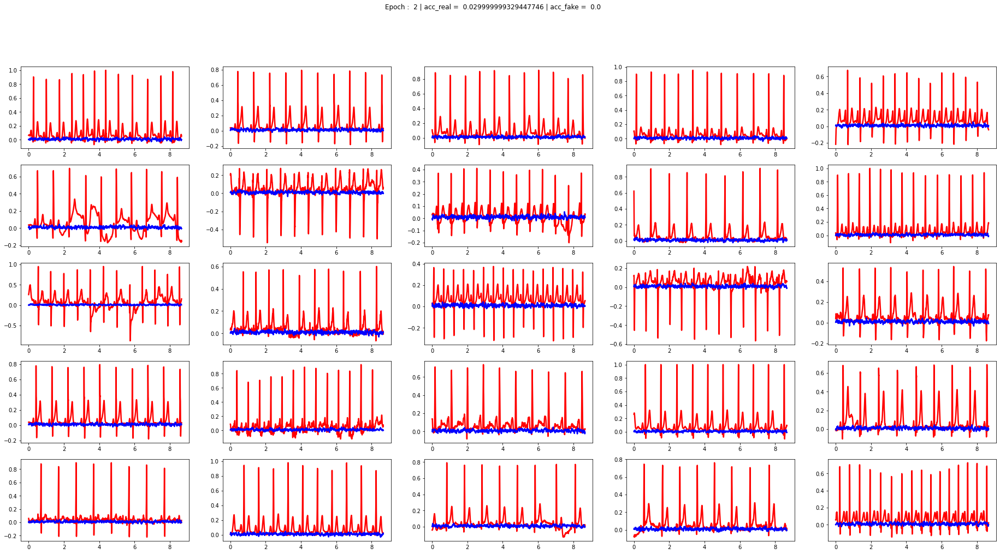

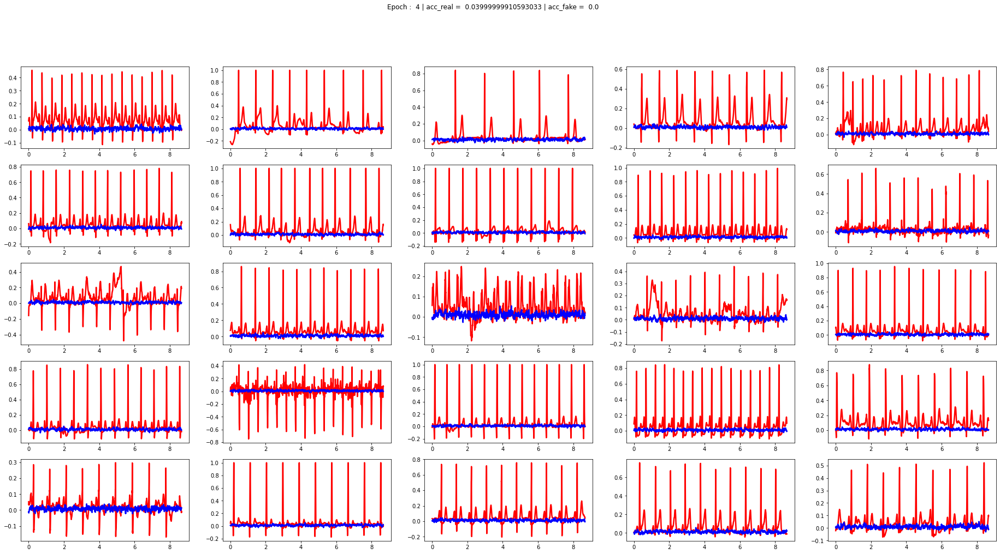

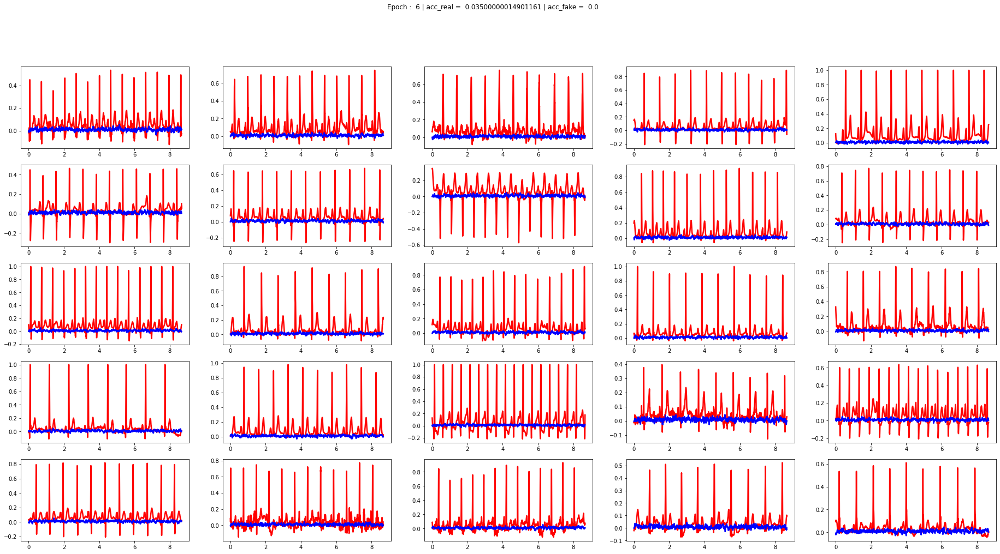

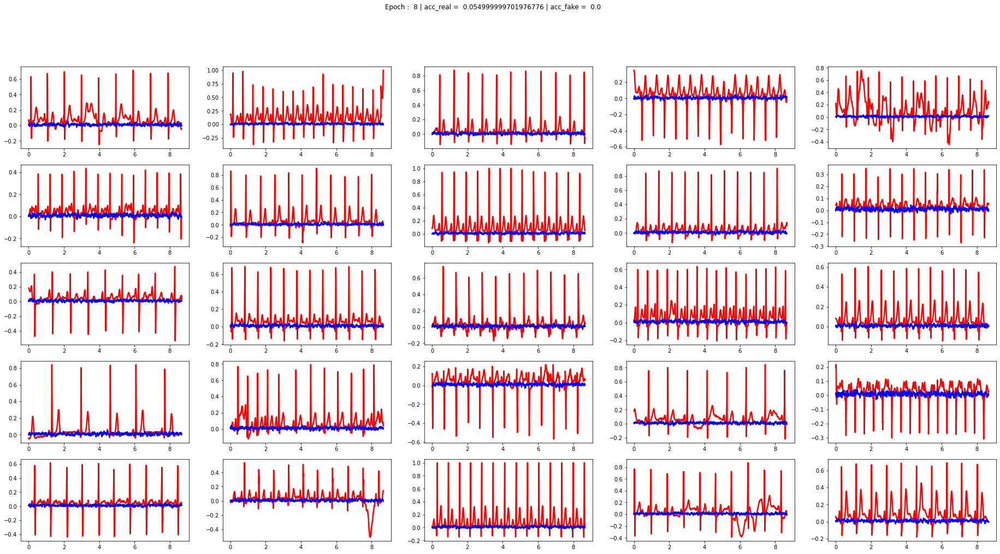

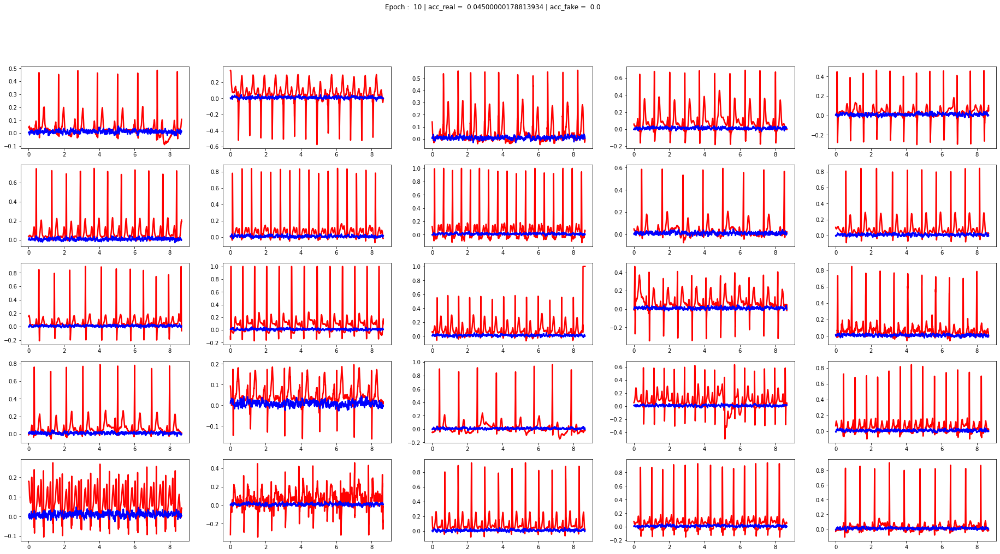

...

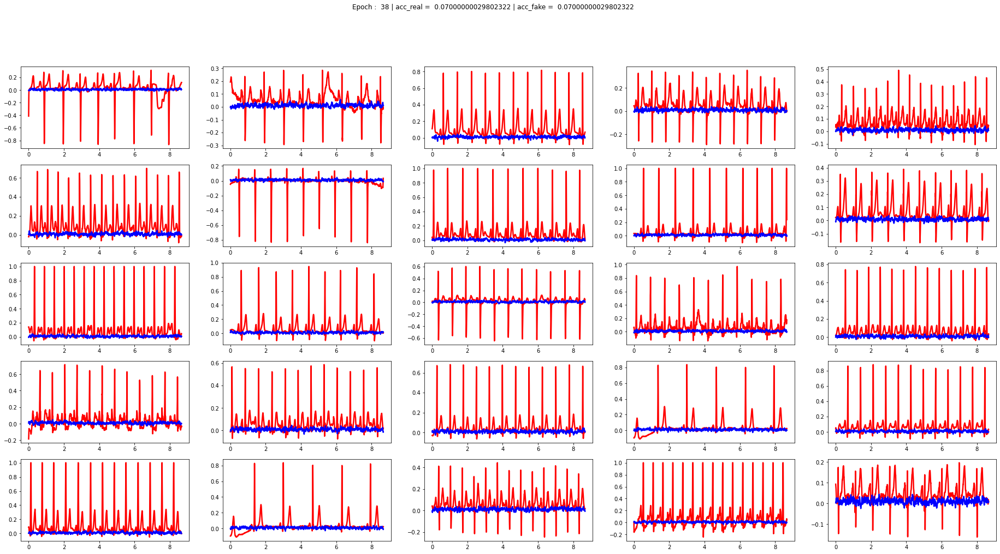

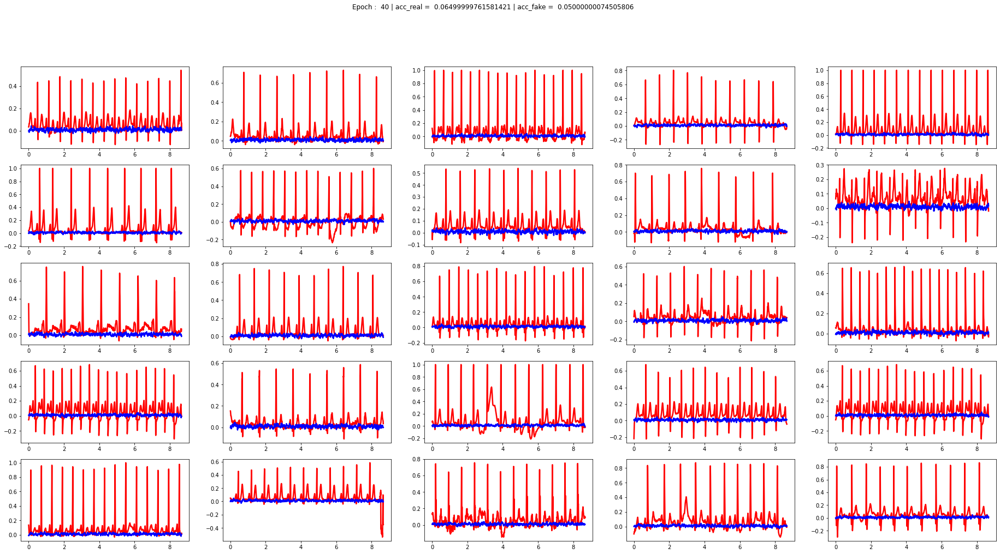

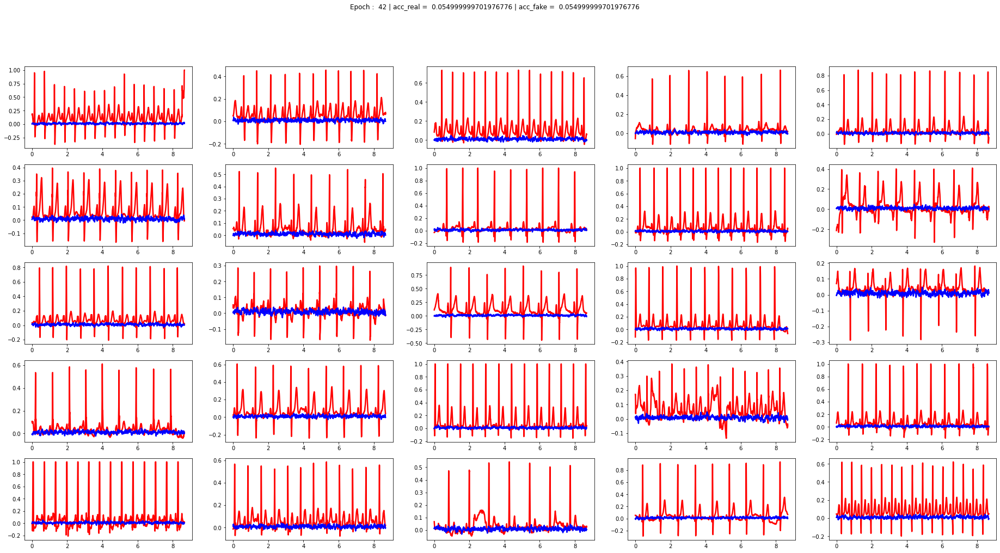

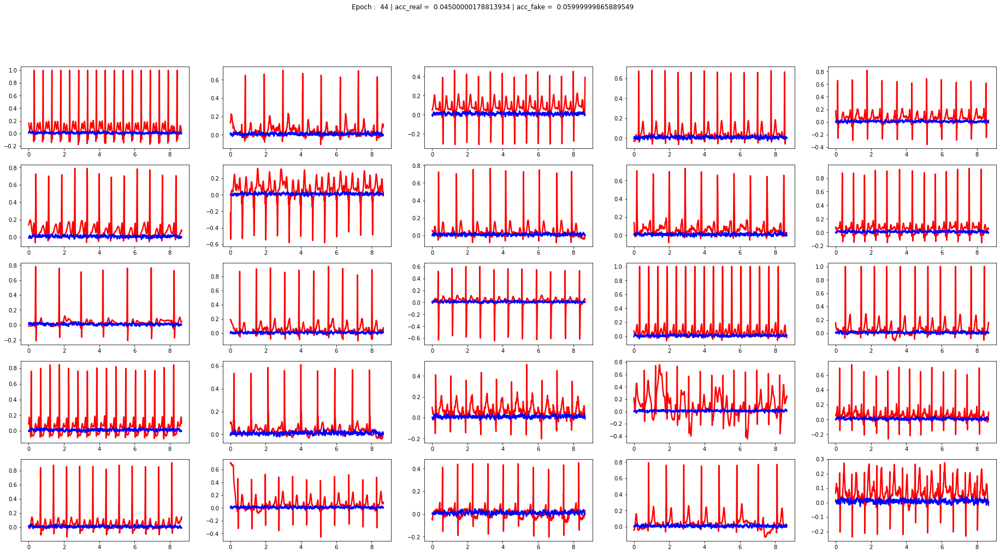

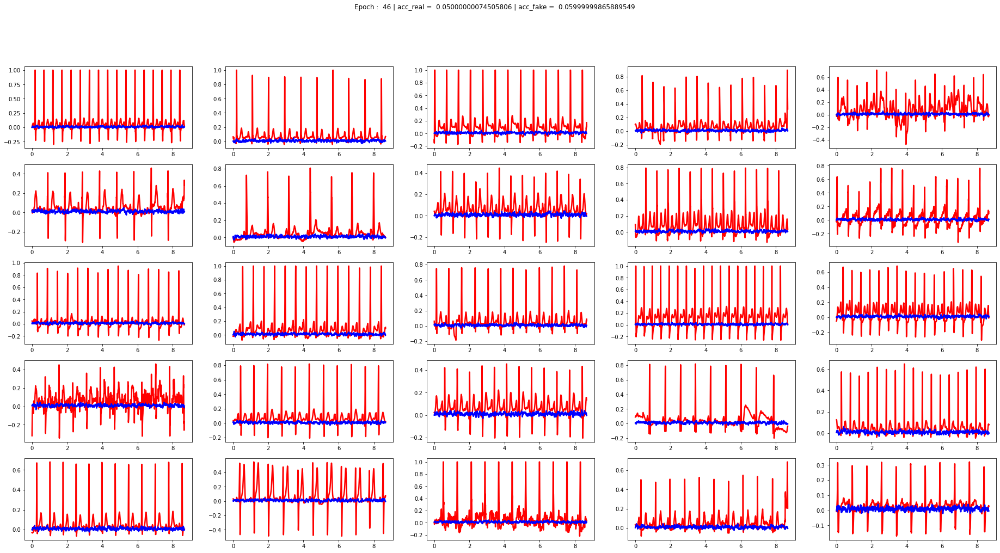

Error in callback <function flush_figures at 0x7f27b6a48598> (for post_execute):


KeyboardInterrupt: ignored

In [0]:
# ukladanie priebehu ucenia GAN - grid signalov 5x5

def save_plot(acc_real, acc_fake, x_real,x_fake,length_of_signal,epoch, n=5):

  # vykreslenie signalov
  time_axis=np.linspace(0,length_of_signal/360,length_of_signal)
  fig = plt.figure(figsize=(32,16))
  fig.suptitle('Epoch :'+ "  " + str(epoch)+" | "+'acc_real ='+"  "+str(acc_real)+" | "+'acc_fake ='+"  "+str(acc_fake))
  for i in range(n * n):
    mysignals = [{'name': 'Real signal', 'x': time_axis, 'y': x_real[i], 'color':'r', 'linewidth':2.5},{'name': 'Fake signal', 'x': time_axis, 'y': x_fake[i], 'color':'b', 'linewidth':2.5}]
    for signal in mysignals:
      ax1 = fig.add_subplot(n, n, 1 + i)
      ax1.plot(signal['x'],signal['y'], color=signal['color'], linewidth=signal['linewidth'], label=signal['name'])

  #ulozenie obrazku signalov na google disk
  plt.savefig(str(WORKDIR_PATH / "GAN/train6/epoch") + str(epoch))

# evaluacia modelu a ukladnie priebehu ucenia gan

def summarize_performance(epoch, g_model, d_model, SI2_II_11_test, latent_dim, batch_size, mu, sigma,length_of_signal):
	# evaluacia testovacich signalov
	x_real, y_real = generate_real_samples(batch_size,SI2_II_11_test)
	_, acc_real = d_model.evaluate(x_real, y_real, verbose=0)
	# evaluacia falosnych vygenerovanych signalov
	x_fake, y_fake = generate_fake_samples(g_model, latent_dim, batch_size, mu, sigma)
	_, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
	# vyhodnotenie 
	print('>Acc Test Real: %.0f%%, Acc Fake: %.0f%%' % (acc_real*100, acc_fake*100))
  # ulozenie obrazkov priebehu ucenia GAN
	save_plot(acc_real, acc_fake, x_real,x_fake,length_of_signal,epoch, n=5)
	# ulozenie modelu generatoru
	g_model.save(str(WORKDIR_PATH / "GAN/train6/generatormodel") + str(epoch))
  

# trenovanie modelu GAN

def train(g_model, d_model, gan_model, latent_dim, signal_train, signal_test, mu, sigma,length_of_signal, n_epochs=100, batch_size=200, n_eval=2):
  #polovica velkosti skupiny a pocet iteracii jednej epochy
  batch_per_epoch = int( SI2_II_11.shape[1] / batch_size)
  half_batch = int(batch_size / 2)

  #epocha
  for i in range(n_epochs):
    # iteracia
    for j in range(batch_per_epoch):
      # vygenerovanie realnych signalov a trening diskriminatoru
      x_real,y_real = generate_real_samples(half_batch,signal_train)
      loss_real,acc_real = d_model.train_on_batch(x_real, y_real)
      # vygenerovanie falosnych signalov a trening diskriminatoru
      x_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch, mu, sigma)
      loss_fake, acc_fake = d_model.train_on_batch(x_fake, y_fake)  
      # vygenerovanie latentnych bodov
      x_gan = generate_latent_points(latent_dim, batch_size,mu,sigma)
      # prevratenie oznacenia triedy falosnych signalov na realne
      y_gan = ones((batch_size, 1))
      # trening generatoru
      g_loss = gan_model.train_on_batch(x_gan, y_gan)
      # ulozenie presnosti a chyb modelov
      d_real_loss_graph_sgd4.append(loss_real)
      d_real_acc_graph_sgd4.append(acc_real)
      d_fake_loss_graph_sgd4.append(loss_fake)
      d_fake_acc_graph_sgd4.append(acc_fake)
      g_loss_graph_sgd4.append(g_loss)
      #ukladanie chyb na disk v pripade straty pripojenia/zlyhania
      np.save(WORKDIR_PATH / "d_real_loss_graph_sgd4",d_real_loss_graph_sgd4)
      np.save(WORKDIR_PATH / "d_real_acc_graph_sgd4",d_real_acc_graph_sgd4)
      np.save(WORKDIR_PATH / "d_fake_loss_graph_sgd4",d_fake_loss_graph_sgd4)
      np.save(WORKDIR_PATH / "d_fake_acc_graph_sgd4",d_fake_acc_graph_sgd4)
      np.save(WORKDIR_PATH / "g_loss_graph_sgd4",g_loss_graph_sgd4)
      # priebezne vysledky modelu
      print('>%d, %d/%d, d_real=%.0f%% d_fake=%.0f%%     		d_loss=%f  g_loss=%f' % (i+1,j+1,batch_per_epoch, acc_real*100, acc_fake*100, (loss_real+loss_fake), g_loss))
    # krok evaluacie modelu a ukladania priebehu ucenia GAN
    if (i+1) % n_eval == 0:
      summarize_performance(i+1, g_model, d_model, signal_test, latent_dim, batch_size, SI2_II_11_train_mean, SI2_II_11_train_std, length_of_signal)

# vytvorenie trenovacej a testovacej databazy 80/20 

number_of_train_signals=int(np.round(number_of_signals*0.8))
SI2_II_11_train=SI2_II_11[:,0:number_of_train_signals]
SI2_II_11_test=SI2_II_11[:,number_of_train_signals:number_of_signals]
print('Shape of TRAIN SI2 signals->     ' + str(np.shape(SI2_II_11_train)))
print('Shape of TEST SI2 signals ->     ' + str(np.shape(SI2_II_11_test)))

# statististiky signalov pre specificke rozlozenie latentnych bodov
SI2_II_11_train_mean=np.mean(np.mean(SI2_II_11_train, axis=0))
SI2_II_11_train_std=np.mean(np.std(SI2_II_11_train, axis=0))
print('Mean of SI2_II_11_train_mean :')
print(SI2_II_11_train_mean)
print('Std of SI2_II_11_train_std :')
print(SI2_II_11_train_std)

d_real_loss_graph_sgd4=[]
d_real_acc_graph_sgd4=[]
d_fake_loss_graph_sgd4=[]
d_fake_acc_graph_sgd4=[]
g_loss_graph_sgd4=[]

# size of the latent space
latent_dim = 5
# create the discriminator
discriminator = define_discriminator()
# create the generator
generator = define_generator(latent_dim)
# create the gan
gan_model = define_gan(generator, discriminator)
# train model
train(generator, discriminator, gan_model, latent_dim, SI2_II_11_train, SI2_II_11_test, SI2_II_11_train_mean, SI2_II_11_train_std, length_of_signal, n_epochs=100, batch_size=200, n_eval=2)



### Analyze GAN performance

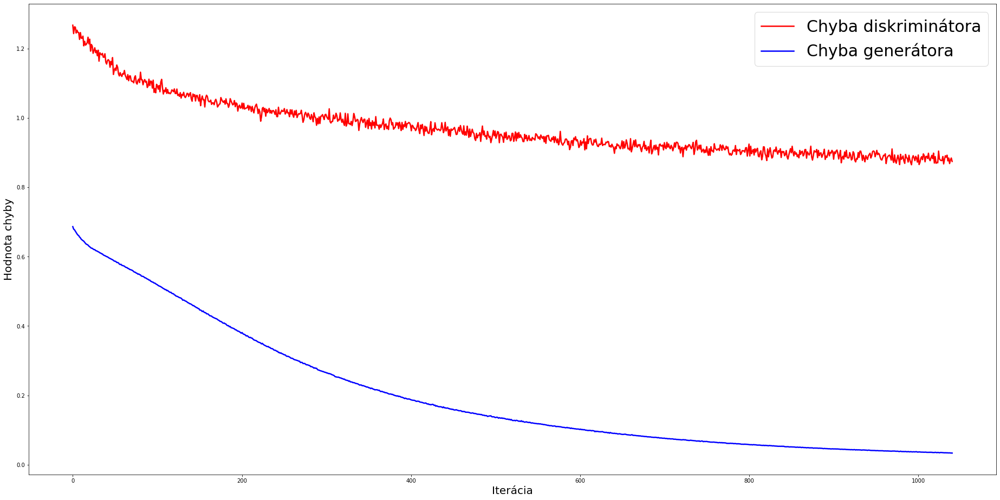

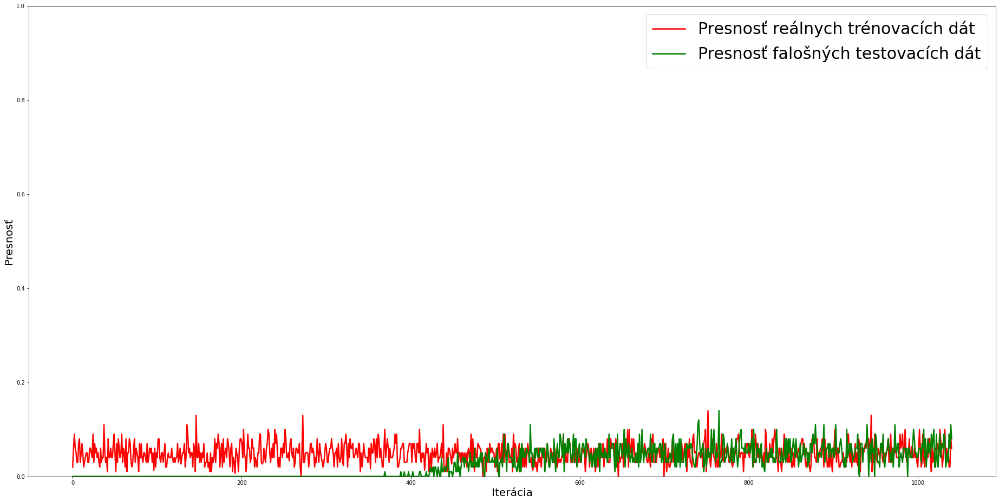

In [0]:
#chyba diskriminatoru a generatoru - #1140 iteracii -510min (8 a pol h)
d_fake_loss_graph_sgd4=np.load(WORKDIR_PATH / "d_fake_loss_graph_sgd4.npy") 
d_real_loss_graph_sgd4=np.load(WORKDIR_PATH / "d_real_loss_graph_sgd4.npy") 
d_loss_total_sgd4=np.array(d_real_loss_graph_sgd4)+np.array(d_fake_loss_graph_sgd4) 
g_loss_graph_sgd4=np.load(WORKDIR_PATH / "g_loss_graph_sgd4.npy")

#prenost diskriminatoru - #1140 iteracii -510min (8 a pol h)
d_real_acc_graph_sgd4=np.load(WORKDIR_PATH / "d_real_acc_graph_sgd4.npy")
d_fake_acc_graph_sgd4=np.load(WORKDIR_PATH / "d_fake_acc_graph_sgd4.npy")

# filtered_acc_real2 = [ item for i,item in enumerate(d_real_acc_graph2) if i%100==0 ]
# filtered_acc_fake2 = [ item for i,item in enumerate(d_fake_acc_graph2) if i%100==0 ]

iterations=int(np.array(np.shape(d_fake_loss_graph_sgd4)))

time_axis=np.linspace(0,iterations,iterations)
fig = plt.figure(figsize=(32,16))
mysignals = [{'name': 'Chyba diskriminátora', 'x': time_axis, 'y': d_loss_total_sgd4[:], 'color':'r', 'linewidth':2.5},{'name': 'Chyba generátora', 'x': time_axis, 'y': g_loss_graph_sgd4[:], 'color':'b', 'linewidth':2.5}]
for signal in mysignals:
  #ax1 = fig.add_subplot(n, n, 1 + i)
  plt.plot(signal['x'],signal['y'], color=signal['color'], linewidth=signal['linewidth'], label=signal['name'])
  #ax1.axis('off')
  plt.legend(loc='upper right',prop={'size': 30})
  plt.xlabel('Iterácia',fontsize=20)
  plt.ylabel('Hodnota chyby',fontsize=20)

time_axis=np.linspace(0,1040,1040)
fig = plt.figure(figsize=(32,16))
mysignals = [{'name': 'Presnosť reálnych trénovacích dát', 'x': time_axis, 'y': d_real_acc_graph_sgd4[:], 'color':'r', 'linewidth':2.5},{'name': 'Presnosť falošných testovacích dát', 'x': time_axis, 'y': d_fake_acc_graph_sgd4[:], 'color':'g', 'linewidth':2.5}]
for signal in mysignals:
  #ax1 = fig.add_subplot(n, n, 1 + i)
  plt.plot(signal['x'],signal['y'], color=signal['color'], linewidth=signal['linewidth'], label=signal['name'])
  #ax1.axis('off')
  #ax1.axis('off')
  plt.legend(loc='upper right',prop={'size': 30})
  plt.xlabel('Iterácia',fontsize=20)
  plt.ylabel('Presnosť',fontsize=20)
  plt.ylim(0,1)